# Contrastive models CLIP

In [1]:
!pip install torch torchvision ftfy regex tqdm matplotlib umap-learn scikit-learn scipy git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-h04yfsrb
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-h04yfsrb
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.0 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=fd8d4339d96dc012dc653dce1de5264f489e57b9b6e19fec084b13f9d0c2fd06
  Stored in directory: /tmp/pip-ephem-wheel-cache-q0osxf1i/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip


In [2]:
#import github clip
!pip install open_clip_torch


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 47.5 MB/s eta 0:00:00


In [4]:
import numpy as np
import torch
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
import numpy as np
from PIL import Image
import os
import clip
import torch.nn.functional as F
from sklearn.manifold import TSNE
import os, math, random, json
from typing import List, Dict, Tuple

In [5]:
def set_seed(seed: int = 91):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
set_seed()

In [6]:
# configuration settings
ARCH = "ViT-B/32"
BATCH_SIZE = 256
NUM_WORKERS = 2
SEED = 91
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# initialization
set_seed(SEED)
device = DEVICE
print(f"Using device: {device}")

Using device: cuda


#LOADING CLIP MODEL

In [7]:
def load_clip_model(device, arch="ViT-B/32"):
    model, preprocess = clip.load(arch, device=device, jit=False)
    model.eval()
    return model, preprocess
model , preprocess = load_clip_model(device=DEVICE, arch = ARCH)
tokenizer = clip.tokenize

100%|███████████████████████████████████████| 338M/338M [00:07<00:00, 44.4MiB/s]


In [ ]:
model

CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32), bias=False)
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): Sequential(
        (0): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): QuickGELU()
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
        (1): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          

In [ ]:
tokenizer

<function clip.clip.tokenize(texts: Union[str, List[str]], context_length: int = 77, truncate: bool = False) -> Union[torch.IntTensor, torch.LongTensor]>

# Loading CUE-CONFLICT, SHAPES AND EDGES data for semantic bias

In [ ]:
import requests
import tarfile
import os

def download_and_extract_tar_gz(url, extract_path='.'):
    # Create directory if it doesn't exist
    os.makedirs(extract_path, exist_ok=True)

    # Download the file
    print("Downloading...")
    response = requests.get(url, stream=True)
    tar_path = os.path.join(extract_path, 'temp.tar.gz')

    with open(tar_path, 'wb') as f:
        for chunk in response.iter_content(chunk_size=8192):
            if chunk:
                f.write(chunk)

    print("Extracting...")
    with tarfile.open(tar_path, 'r:gz') as tar:
        tar.extractall(path=extract_path)

    # Remove the temporary tar file
    os.remove(tar_path)
    print("Download and extraction completed!")

urls = urls = ["https://github.com/bethgelab/model-vs-human/releases/download/v0.1/cue-conflict.tar.gz","https://github.com/bethgelab/model-vs-human/releases/download/v0.1/edge.tar.gz",
       "https://github.com/bethgelab/model-vs-human/releases/download/v0.1/colour.tar.gz","https://github.com/bethgelab/model-vs-human/releases/download/v0.1/rotation.tar.gz",
       "https://github.com/bethgelab/model-vs-human/releases/download/v0.1/silhouette.tar.gz","https://github.com/bethgelab/model-vs-human/releases/download/v0.1/sketch.tar.gz",
       "https://github.com/bethgelab/model-vs-human/releases/download/v0.1/stylized.tar.gz","https://github.com/bethgelab/model-vs-human/releases/download/v0.1/uniform-noise.tar.gz",
       "https://github.com/bethgelab/model-vs-human/releases/download/v0.1/false-colour.tar.gz","https://github.com/bethgelab/model-vs-human/releases/download/v0.1/contrast.tar.gz"]

for url in urls:
  download_and_extract_tar_gz(url, 'dataset')

Downloading...
Extracting...


/tmp/ipython-input-1944611556.py:21: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path=extract_path)


Download and extraction completed!
Downloading...
Extracting...
Download and extraction completed!
Downloading...
Extracting...
Download and extraction completed!
Downloading...
Extracting...
Download and extraction completed!
Downloading...
Extracting...
Download and extraction completed!
Downloading...
Extracting...
Download and extraction completed!
Downloading...
Extracting...
Download and extraction completed!
Downloading...
Extracting...
Download and extraction completed!
Downloading...
Extracting...
Download and extraction completed!
Downloading...
Extracting...
Download and extraction completed!


In [ ]:
class CueConflictDataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, preprocess):
        self.samples = []
        self.classes = []
        self.class_to_idx = {}
        self.preprocess = preprocess

        # Traverse through subdirectories (classes)
        for class_name in sorted(os.listdir(root_dir)):
            class_path = os.path.join(root_dir, class_name)
            if not os.path.isdir(class_path):
                continue

            if class_name not in self.class_to_idx:
                self.class_to_idx[class_name] = len(self.classes)
                self.classes.append(class_name)

            for fname in os.listdir(class_path):
                if fname.lower().endswith((".jpg", ".jpeg", ".png", ".bmp", ".webp")):
                    img_path = os.path.join(class_path, fname)
                    self.samples.append((img_path, self.class_to_idx[class_name]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, target = self.samples[idx]
        img = Image.open(path).convert("RGB")
        img = self.preprocess(img)
        return img, target

@torch.no_grad()
def infer_zero_shot(model, image_loader, text_features, device, progress_desc="Zero-shot Inference"):
    """
    text_features: [C, D] normalized
    Returns predictions list and true labels list.
    """
    preds = []
    true_labels = []

    for images, targets in tqdm(image_loader, desc=f"Eval {progress_desc}", leave=False):
        images = images.to(device)
        image_features = model.encode_image(images)
        image_features = F.normalize(image_features, dim=-1)  # [B, D]

        logits = 100.0 * image_features @ text_features.t()  # [B, C]
        pred = logits.argmax(dim=-1)  # [B]

        preds.extend(pred.detach().cpu().tolist())
        true_labels.extend(targets.detach().cpu().tolist())

    return preds, true_labels

Using device: cuda


# Evaluating Zero-Shot Accuracy on Cue-Conflict, Edge and Silhouttes dataset of Model-vs-Human benchmark

In [ ]:
edge_data_root = "/content/dataset/edge"
cue_conflict_data_root = "/content/dataset/cue-conflict"
silhouette_data_root = "/content/dataset/silhouette"
data_roots = [cue_conflict_data_root, edge_data_root, silhouette_data_root]

for data_root in data_roots:
    domain_name = os.path.basename(data_root)
    print(f"\n--- Evaluating on dataset: {domain_name} ---")

    try:
        dataset = CueConflictDataset(data_root, preprocess)
        loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        print(f"\nLoaded {len(dataset)} images from the {domain_name} dataset.")
        classes = dataset.classes
        print(f"{domain_name} classes: {classes}")

        # Build prompts and encode text for classes
        prompts_by_class = build_prompts(classes, TEMPLATES)
        _, ensembled_text_features = encode_text_prompts(
            model, tokenizer, prompts_by_class, device
        )

        # Perform zero-shot inference on the dataset
        print(f"\nEvaluating zero-shot accuracy on {domain_name} dataset:")
        preds, true_labels = infer_zero_shot(model, loader, ensembled_text_features, device, progress_desc=domain_name)

        # Calculate and print accuracy per class and overall
        total_correct = 0
        total_samples = 0
        class_correct = {}
        class_total = {}

        for i in range(len(classes)):
            class_correct[i] = 0
            class_total[i] = 0

        for pred, true_label in zip(preds, true_labels):
            if pred == true_label:
                total_correct += 1
                class_correct[true_label] += 1
            total_samples += 1
            class_total[true_label] += 1

        print("\nAccuracy per class:")
        for i, class_name in enumerate(classes):
            accuracy = (class_correct[i] / class_total[i] * 100.0) if class_total[i] > 0 else 0.0
            print(f"  {class_name}: {accuracy:.2f}% ({class_correct[i]}/{class_total[i]})")

        overall_accuracy = (total_correct / total_samples * 100.0) if total_samples > 0 else 0.0
        print(f"\nOverall accuracy: {overall_accuracy:.2f}% ({total_correct}/{total_samples})")

    except FileNotFoundError:
        print(f"Error: Dataset not found at {data_root}.")
    except Exception as e:
        print(f"An error occurred during {domain_name} dataset evaluation: {e}")


--- Evaluating on dataset: cue-conflict ---

Loaded 1280 images from the cue-conflict dataset.
cue-conflict classes: ['airplane', 'bear', 'bicycle', 'bird', 'boat', 'bottle', 'car', 'cat', 'chair', 'clock', 'dog', 'elephant', 'keyboard', 'knife', 'oven', 'truck']

Evaluating zero-shot accuracy on cue-conflict dataset:



Accuracy per class:
  airplane: 28.75% (23/80)
  bear: 31.25% (25/80)
  bicycle: 80.00% (64/80)
  bird: 37.50% (30/80)
  boat: 18.75% (15/80)
  bottle: 67.50% (54/80)
  car: 65.00% (52/80)
  cat: 45.00% (36/80)
  chair: 62.50% (50/80)
  clock: 72.50% (58/80)
  dog: 22.50% (18/80)
  elephant: 57.50% (46/80)
  keyboard: 31.25% (25/80)
  knife: 18.75% (15/80)
  oven: 33.75% (27/80)
  truck: 47.50% (38/80)

Overall accuracy: 45.00% (576/1280)

--- Evaluating on dataset: edge ---

Loaded 160 images from the edge dataset.
edge classes: ['airplane', 'bear', 'bicycle', 'bird', 'boat', 'bottle', 'car', 'cat', 'chair', 'clock', 'dog', 'elephant', 'keyboard', 'knife', 'oven', 'truck']

Evaluating zero-shot accuracy on edge dataset:



Accuracy per class:
  airplane: 70.00% (7/10)
  bear: 50.00% (5/10)
  bicycle: 100.00% (10/10)
  bird: 70.00% (7/10)
  boat: 50.00% (5/10)
  bottle: 100.00% (10/10)
  car: 100.00% (10/10)
  cat: 80.00% (8/10)
  chair: 100.00% (10/10)
  clock: 100.00% (10/10)
  dog: 80.00% (8/10)
  elephant: 100.00% (10/10)
  keyboard: 100.00% (10/10)
  knife: 90.00% (9/10)
  oven: 60.00% (6/10)
  truck: 60.00% (6/10)

Overall accuracy: 81.88% (131/160)

--- Evaluating on dataset: silhouette ---

Loaded 160 images from the silhouette dataset.
silhouette classes: ['airplane', 'bear', 'bicycle', 'bird', 'boat', 'bottle', 'car', 'cat', 'chair', 'clock', 'dog', 'elephant', 'keyboard', 'knife', 'oven', 'truck']

Evaluating zero-shot accuracy on silhouette dataset:



Accuracy per class:
  airplane: 100.00% (10/10)
  bear: 80.00% (8/10)
  bicycle: 100.00% (10/10)
  bird: 90.00% (9/10)
  boat: 30.00% (3/10)
  bottle: 100.00% (10/10)
  car: 80.00% (8/10)
  cat: 40.00% (4/10)
  chair: 100.00% (10/10)
  clock: 50.00% (5/10)
  dog: 60.00% (6/10)
  elephant: 80.00% (8/10)
  keyboard: 10.00% (1/10)
  knife: 100.00% (10/10)
  oven: 30.00% (3/10)
  truck: 50.00% (5/10)

Overall accuracy: 68.75% (110/160)


# Visulaization Of Accuracies

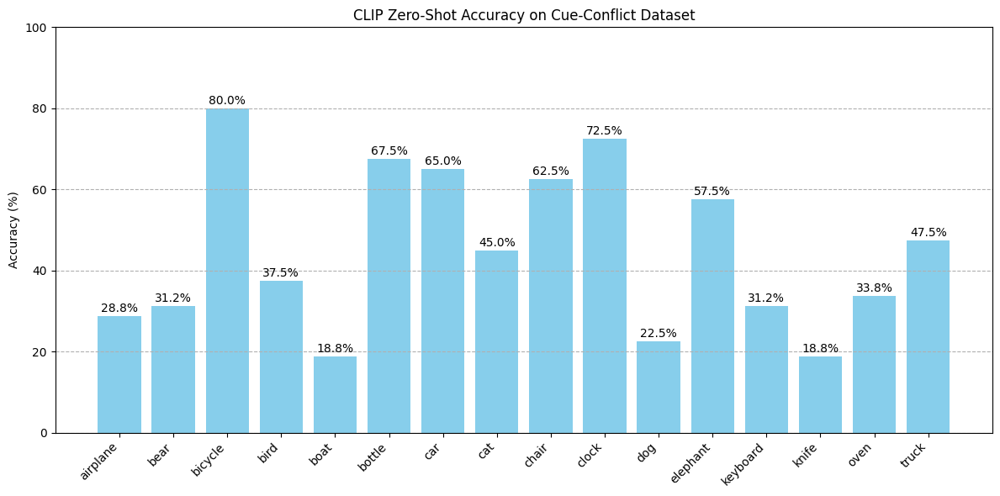

In [ ]:
import matplotlib.pyplot as plt

acc = {
    "airplane": 28.75, "bear": 31.25, "bicycle": 80.00, "bird": 37.50,
    "boat": 18.75, "bottle": 67.50, "car": 65.00, "cat": 45.00,
    "chair": 62.50, "clock": 72.50, "dog": 22.50, "elephant": 57.50,
    "keyboard": 31.25, "knife": 18.75, "oven": 33.75, "truck": 47.50
}

plt.figure(figsize=(12,6))
bars = plt.bar(acc.keys(), acc.values(), color="skyblue")
plt.xticks(rotation=45, ha="right")
plt.ylim(0,100)
plt.grid(axis="y", linestyle="--")
plt.title("CLIP Zero-Shot Accuracy on Cue-Conflict Dataset")
plt.ylabel("Accuracy (%)")

for b,a in zip(bars, acc.values()):
    plt.text(b.get_x()+b.get_width()/2, a+1, f"{a:.1f}%", ha="center")

plt.tight_layout()
plt.show()


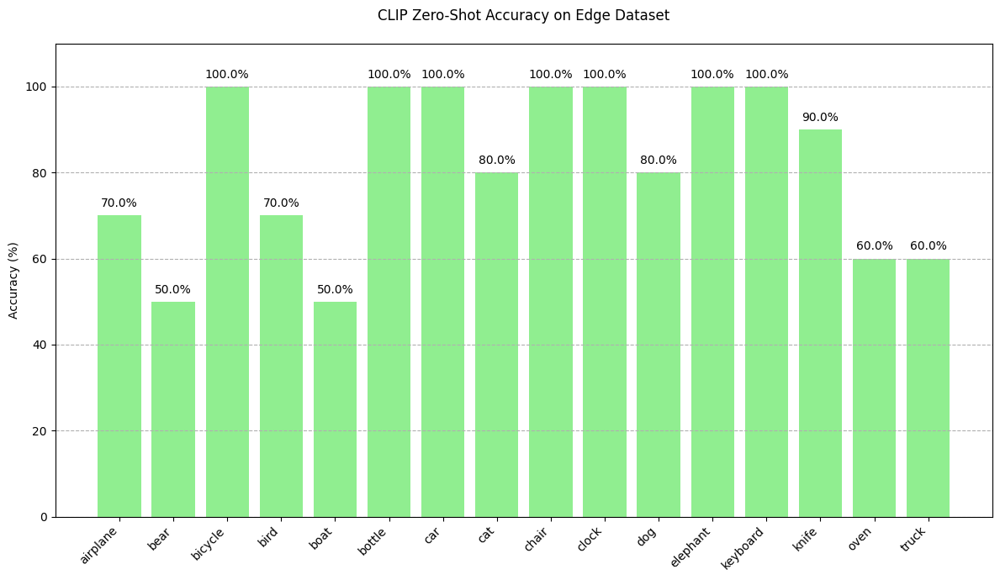

In [ ]:
import matplotlib.pyplot as plt

acc = {
    "airplane": 70.0, "bear": 50.0, "bicycle": 100.0, "bird": 70.0,
    "boat": 50.0, "bottle": 100.0, "car": 100.0, "cat": 80.0,
    "chair": 100.0, "clock": 100.0, "dog": 80.0, "elephant": 100.0,
    "keyboard": 100.0, "knife": 90.0, "oven": 60.0, "truck": 60.0
}

plt.figure(figsize=(12,7))  # taller figure
bars = plt.bar(acc.keys(), acc.values(), color="lightgreen")
plt.xticks(rotation=45, ha="right")
plt.ylim(0,110)  # leave room above 100 for labels
plt.grid(axis="y", linestyle="--")

# move title up a bit with pad
plt.title("CLIP Zero-Shot Accuracy on Edge Dataset", pad=20)
plt.ylabel("Accuracy (%)")

for b,a in zip(bars, acc.values()):
    plt.text(b.get_x()+b.get_width()/2, a+2, f"{a:.1f}%", ha="center")

plt.tight_layout()
plt.show()


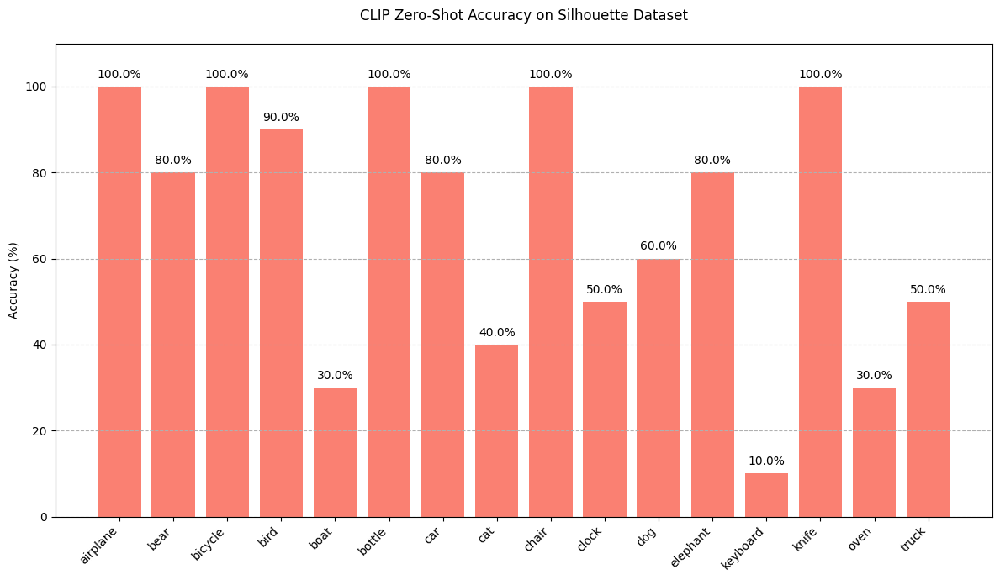

In [ ]:
import matplotlib.pyplot as plt

acc = {
    "airplane": 100.0, "bear": 80.0, "bicycle": 100.0, "bird": 90.0,
    "boat": 30.0, "bottle": 100.0, "car": 80.0, "cat": 40.0,
    "chair": 100.0, "clock": 50.0, "dog": 60.0, "elephant": 80.0,
    "keyboard": 10.0, "knife": 100.0, "oven": 30.0, "truck": 50.0
}

plt.figure(figsize=(12,7))  # taller figure
bars = plt.bar(acc.keys(), acc.values(), color="salmon")
plt.xticks(rotation=45, ha="right")
plt.ylim(0,110)                     # add space above 100
plt.grid(axis="y", linestyle="--")
plt.title("CLIP Zero-Shot Accuracy on Silhouette Dataset", pad=20)
plt.ylabel("Accuracy (%)")

for b,a in zip(bars, acc.values()):
    plt.text(b.get_x()+b.get_width()/2, a+2, f"{a:.1f}%", ha="center")

plt.tight_layout()
plt.show()


# Displaying True Vs Predicted results of Cue-Conflict, Edge and Silhouttes dataset of Model-vs-Human benchmark

Displaying Cue-Conflict Images and Predictions:


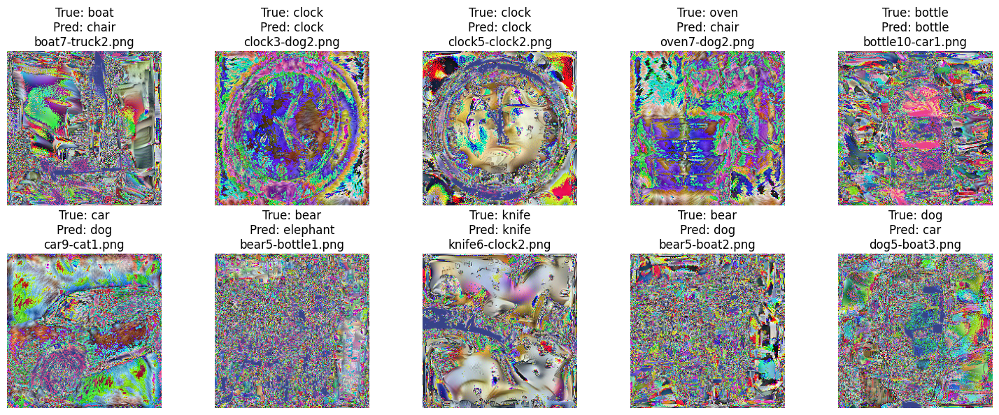


Displaying Edge Images and Predictions:


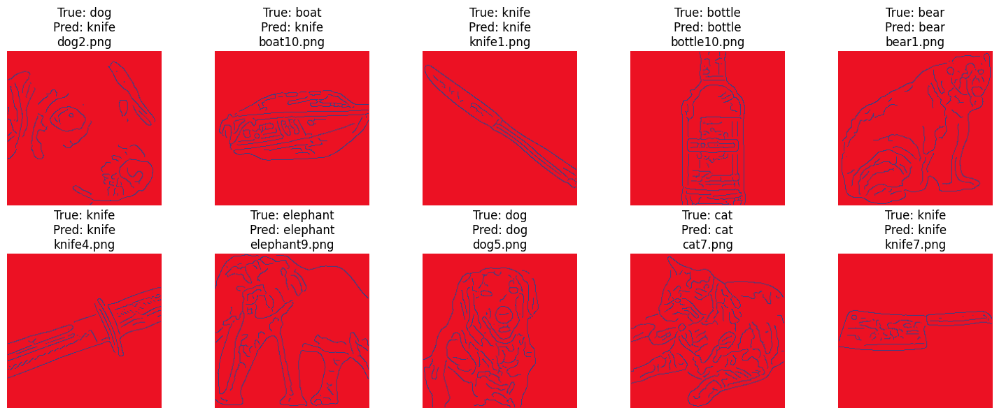


Displaying Silhouette Images and Predictions:


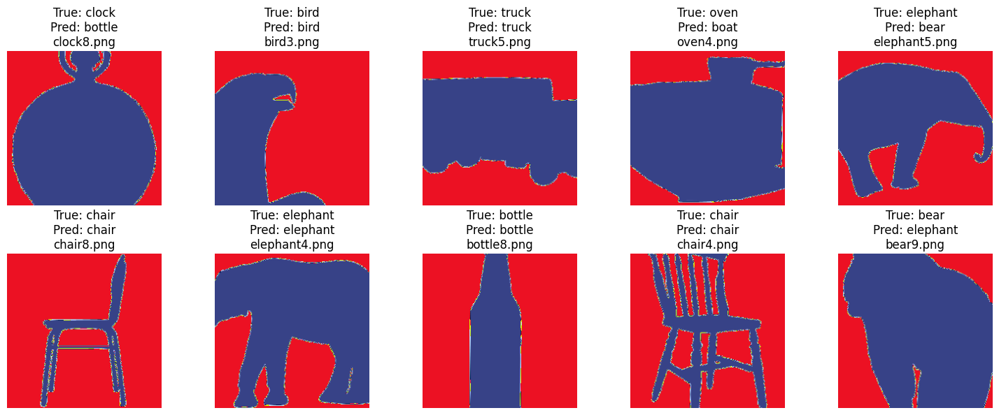

In [ ]:
def display_images_with_labels(dataset, loader, model, text_features, classes, device, num_images=10):
    """
    Displays a subset of images from a dataset with their true and predicted labels.
    """
    model.eval()
    images_to_show = []
    true_labels_to_show = []
    predicted_labels_to_show = []
    image_paths_to_show = []

    # Select random indices
    if len(dataset) > num_images:
        indices = random.sample(range(len(dataset)), num_images)
    else:
        indices = range(len(dataset))
        num_images = len(dataset)

    # Create a subset dataset and loader for selected indices
    subset_dataset = torch.utils.data.Subset(dataset, indices)
    subset_loader = DataLoader(subset_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)


    with torch.no_grad():
        for images, targets in subset_loader:
            images = images.to(device)
            image_features = model.encode_image(images)
            image_features = F.normalize(image_features, dim=-1)

            logits = 100.0 * image_features @ text_features.t()
            preds = logits.argmax(dim=-1)

            images_to_show.extend(images.cpu())
            true_labels_to_show.extend(targets.cpu().tolist())
            predicted_labels_to_show.extend(preds.cpu().tolist())

    # Retrieve the original image paths for displaying titles
    for idx in indices:
        image_paths_to_show.append(dataset.samples[idx][0])


    # Display the images
    cols = 5
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    axes = axes.flatten() # Flatten in case of a single row

    for i in range(num_images):
        img = transforms.ToPILImage()(images_to_show[i])
        ax = axes[i]
        ax.imshow(img)
        true_label = classes[true_labels_to_show[i]]
        predicted_label = classes[predicted_labels_to_show[i]]
        # Use filename for title if possible, otherwise use index
        title = f"True: {true_label}\nPred: {predicted_label}"
        try:
            title += f"\n{os.path.basename(image_paths_to_show[i])}"
        except:
            pass # Ignore if path is not available


        ax.set_title(title)
        ax.axis("off")

    # Hide any unused subplots
    for j in range(num_images, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


# Define the root directories for the datasets
edge_data_root = "/content/dataset/edge"
cue_conflict_data_root = "/content/dataset/cue-conflict"
silhouette_data_root = "/content/dataset/silhouette"

# Evaluate and display for Cue-Conflict
print("Displaying Cue-Conflict Images and Predictions:")
cue_conflict_dataset = CueConflictDataset(cue_conflict_data_root, preprocess)
cue_conflict_loader = DataLoader(cue_conflict_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
cue_conflict_classes = cue_conflict_dataset.classes

# encoding texts
cue_conflict_prompts_by_class = build_prompts(cue_conflict_classes, TEMPLATES)
_, cue_conflict_ensembled_text_features = encode_text_prompts(
    model, tokenizer, cue_conflict_prompts_by_class, device
)
display_images_with_labels(cue_conflict_dataset, cue_conflict_loader, model, cue_conflict_ensembled_text_features, cue_conflict_classes, device, num_images=10)


# Evaluate and display for Edge
print("\nDisplaying Edge Images and Predictions:")
edge_dataset = CueConflictDataset(edge_data_root, preprocess)
edge_loader = DataLoader(edge_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
edge_classes = edge_dataset.classes
edge_prompts_by_class = build_prompts(edge_classes, TEMPLATES)
_, edge_ensembled_text_features = encode_text_prompts(
    model, tokenizer, edge_prompts_by_class, device
)
display_images_with_labels(edge_dataset, edge_loader, model, edge_ensembled_text_features, edge_classes, device, num_images=10)


# Evaluate and display for Silhouette
print("\nDisplaying Silhouette Images and Predictions:")
silhouette_data_root = "/content/dataset/silhouette"
silhouette_dataset = CueConflictDataset(silhouette_data_root, preprocess)
silhouette_loader = DataLoader(silhouette_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
silhouette_classes = silhouette_dataset.classes
silhouette_prompts_by_class = build_prompts(silhouette_classes, TEMPLATES)
_, silhouette_ensembled_text_features = encode_text_prompts(
    model, tokenizer, silhouette_prompts_by_class, device
)
display_images_with_labels(silhouette_dataset, silhouette_loader, model, silhouette_ensembled_text_features, silhouette_classes, device, num_images=10)

LOAD CIFAR-10 dataset

In [8]:
def build_cifar10_loaders(preprocess, batch_size=256, num_workers=2):
    test_set = datasets.CIFAR10(root="./data", train=False, download=True, transform=preprocess)
    test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)
    return test_set, test_loader
cifar_test, cifar_loader = build_cifar10_loaders(preprocess, BATCH_SIZE, NUM_WORKERS)
cifar_classes = cifar_test.classes
print(f"CIFAR-10 classes: {cifar_classes}")

100%|██████████| 170M/170M [00:06<00:00, 24.8MB/s]


CIFAR-10 classes: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# Prompt Engineering

In [9]:
TEMPLATES = [
    "a photo of the {}",
    "a picture of a {}",
    "a colorful picture of {}",
    "the painting of a {}",
    "a blurry photo of a {}",
    "a big {}",
    "a drawing of a {}",
    "a sketch of a {}",
]

# BUILDING TEXT PROMPTS FROM TEMPLATES (8 TEMPLATES, 10 CLASSES) 8 X 10 = 80

In [10]:
def build_prompts(classes, templates):
    """Return dict: class_name -> [prompt variants]"""
    return {c: [t.format(c) for t in templates] for c in classes}
prompts_by_class = build_prompts(cifar_classes, TEMPLATES)
prompts_by_class

{'airplane': ['a photo of the airplane',
  'a picture of a airplane',
  'a colorful picture of airplane',
  'the painting of a airplane',
  'a blurry photo of a airplane',
  'a big airplane',
  'a drawing of a airplane',
  'a sketch of a airplane'],
 'automobile': ['a photo of the automobile',
  'a picture of a automobile',
  'a colorful picture of automobile',
  'the painting of a automobile',
  'a blurry photo of a automobile',
  'a big automobile',
  'a drawing of a automobile',
  'a sketch of a automobile'],
 'bird': ['a photo of the bird',
  'a picture of a bird',
  'a colorful picture of bird',
  'the painting of a bird',
  'a blurry photo of a bird',
  'a big bird',
  'a drawing of a bird',
  'a sketch of a bird'],
 'cat': ['a photo of the cat',
  'a picture of a cat',
  'a colorful picture of cat',
  'the painting of a cat',
  'a blurry photo of a cat',
  'a big cat',
  'a drawing of a cat',
  'a sketch of a cat'],
 'deer': ['a photo of the deer',
  'a picture of a deer',
  'a 

#ENCODED PER TEMPLATE AND ENSEMBLED

In [15]:
@torch.no_grad()
def encode_text_prompts(model, tokenizer, prompts_by_class, device):
    """
    For each class, encode all its prompts.
    Return:
      - per_template_text_features: list[np.ndarray] length = num_templates (each is [C, D])
      - ensembled_text_features: torch.Tensor [C, D] (mean of normalized per-prompt embeddings)
    """
    class_names = list(prompts_by_class.keys())
    num_classes = len(class_names)
    # prompts are aligned by template index: prompts_by_class[c][k] is the k-th template
    num_templates = len(next(iter(prompts_by_class.values())))
    per_template_feats = []

    # Per-template features (C, D)
    for k in range(num_templates):
        texts = [prompts_by_class[c][k] for c in class_names]
        text_tokens = tokenizer(texts).to(device)
        text_features = model.encode_text(text_tokens)
        text_features = F.normalize(text_features, dim=-1)
        per_template_feats.append(text_features)  # [C, D]

    # Ensembling: average normalized features across templates, then re-normalize
    stacked = torch.stack(per_template_feats, dim=0)  # [T, C, D]
    ensembled = F.normalize(stacked.mean(dim=0), dim=-1)  # [C, D]
    return per_template_feats, ensembled

per_template_text_features, ensembled_text_features = encode_text_prompts(model, tokenizer, prompts_by_class, device)

In [ ]:
per_template_text_features[1].shape

torch.Size([10, 512])

In [ ]:
ensembled_text_features.shape

torch.Size([10, 512])

# TESTING CLIP ON A CAT IMAGE

In [ ]:
import os
from PIL import Image
import torch
import torch.nn.functional as F

uploaded_image_path = "/content/caption-me.jpg"

if os.path.exists(uploaded_image_path):
    try:
        # Load and preprocess the image
        image = Image.open(uploaded_image_path).convert("RGB")
        image_input = preprocess(image).unsqueeze(0).to(device)

        # Encode the image
        with torch.no_grad():
            image_features = model.encode_image(image_input)
            image_features = F.normalize(image_features, dim=-1)

        # Calculate similarity with text features (using the ensembled features from CIFAR-10)
        similarity = (100.0 * image_features @ ensembled_text_features.T).softmax(dim=-1)

        # Get the top prediction
        values, indices = similarity[0].topk(1)

        # Print the result
        print(f"\nTop prediction for the image at {uploaded_image_path}:")
        for value, index in zip(values, indices):
            print(f"{cifar_classes[index]}: {100 * value.item():.2f}%")

    except Exception as e:
        print(f"Error processing image {uploaded_image_path}: {e}")
else:
    print(f"Error: Image file not found at {uploaded_image_path}")


Top prediction for the image at /content/caption-me.jpg:
cat: 98.19%


## Testing clip inference on a test image: clip has correctly identified image to be of cat with 98.19%

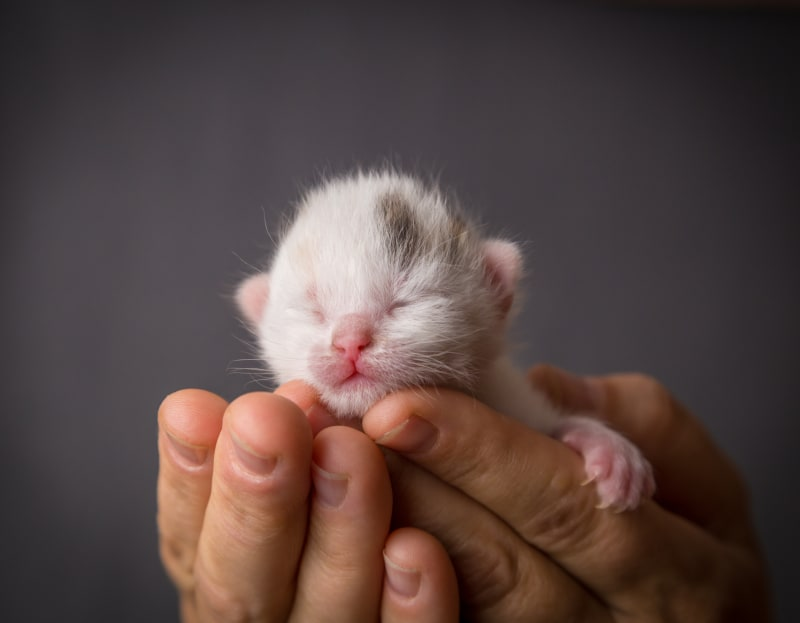

# CODE FOR ZERO SHOT INFERENCES

In [12]:
@torch.no_grad()
def infer_zero_shot(model, image_loader, text_features, device, progress_desc="CIFAR-10"):
    """
    text_features: [C, D] normalized
    Returns predictions list and true labels list.
    """
    correct = 0
    total = 0
    preds = []
    true_labels = [] # Initialize true_labels list

    for images, targets in tqdm(image_loader, desc=f"Eval {progress_desc}", leave=False):
        images = images.to(device)
        image_features = model.encode_image(images)
        image_features = F.normalize(image_features, dim=-1)  # [B, D]

        logits = 100.0 * image_features @ text_features.t()  # [B, C]
        pred = logits.argmax(dim=-1)  # [B]

        preds.extend(pred.detach().cpu().tolist())
        if targets is not None:
            true_labels.extend(targets.detach().cpu().tolist())

    acc = (correct / total * 100.0) if total > 0 else None
    return preds, true_labels

# Evaluating Zero-Shot Accuracy of CLIP on CIFAR-10

# Evaluating Using Ensembled Prompts

In [16]:
# Load the CIFAR-10 test dataset and create DataLoader
cifar_testset = datasets.CIFAR10(root="./data", train=False, download=True, transform=preprocess)
cifar_loader = DataLoader(cifar_testset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
cifar_classes = cifar_testset.classes
print(f"CIFAR-10 classes: {cifar_classes}")

# Build prompts and encode text for CIFAR-10 classes
prompts_by_class = build_prompts(cifar_classes, TEMPLATES)
_, ensembled_text_features = encode_text_prompts(model, tokenizer, prompts_by_class, device)

# Perform zero-shot inference on CIFAR-10
print("\nEvaluating zero-shot accuracy on CIFAR-10 (no training):")
preds, true_labels = infer_zero_shot(model, cifar_loader, ensembled_text_features, device)

# Calculate and print accuracy per class and overall
total_correct = 0
total_samples = 0
class_correct = {}
class_total = {}

for i in range(len(cifar_classes)):
    class_correct[i] = 0
    class_total[i] = 0

for pred, true_label in zip(preds, true_labels):
    if pred == true_label:
        total_correct += 1
        class_correct[true_label] += 1
    total_samples += 1
    class_total[true_label] += 1

print("\nAccuracy per class:")
for i, class_name in enumerate(cifar_classes):
    accuracy = (class_correct[i] / class_total[i] * 100.0) if class_total[i] > 0 else 0.0
    print(f"  {class_name}: {accuracy:.2f}% ({class_correct[i]}/{class_total[i]})")

overall_accuracy = (total_correct / total_samples * 100.0) if total_samples > 0 else 0.0
print(f"\nOverall accuracy: {overall_accuracy:.2f}% ({total_correct}/{total_samples})")

CIFAR-10 classes: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

Evaluating zero-shot accuracy on CIFAR-10 (no training):



Accuracy per class:
  airplane: 93.20% (932/1000)
  automobile: 97.80% (978/1000)
  bird: 87.70% (877/1000)
  cat: 86.90% (869/1000)
  deer: 81.70% (817/1000)
  dog: 88.30% (883/1000)
  frog: 79.10% (791/1000)
  horse: 96.40% (964/1000)
  ship: 93.40% (934/1000)
  truck: 89.80% (898/1000)

Overall accuracy: 89.43% (8943/10000)


# Evaluating Accuracy on CIFAR-10 using Class names only

In [14]:
# Load the CIFAR-10 test dataset and create DataLoader
cifar_testset = datasets.CIFAR10(root="./data", train=False, download=True, transform=preprocess)
cifar_loader = DataLoader(cifar_testset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
cifar_classes = cifar_testset.classes
print(f"CIFAR-10 classes: {cifar_classes}")

# Encode text for CIFAR-10 classes using only class names
text_tokens = tokenizer(cifar_classes).to(device)
text_features = model.encode_text(text_tokens)
text_features = F.normalize(text_features, dim=-1)

# Perform zero-shot inference on CIFAR-10 using class names
print("\nEvaluating zero-shot accuracy on CIFAR-10 (using class names only):")
preds, true_labels = infer_zero_shot(model, cifar_loader, text_features, device, progress_desc="CIFAR-10 (class names)")

# Calculate and print accuracy per class and overall
total_correct = 0
total_samples = 0
class_correct = {}
class_total = {}

for i in range(len(cifar_classes)):
    class_correct[i] = 0
    class_total[i] = 0

for pred, true_label in zip(preds, true_labels):
    if pred == true_label:
        total_correct += 1
        class_correct[true_label] += 1
    total_samples += 1
    class_total[true_label] += 1

print("\nAccuracy per class:")
for i, class_name in enumerate(cifar_classes):
    accuracy = (class_correct[i] / class_total[i] * 100.0) if class_total[i] > 0 else 0.0
    print(f"  {class_name}: {accuracy:.2f}% ({class_correct[i]}/{class_total[i]})")

overall_accuracy = (total_correct / total_samples * 100.0) if total_samples > 0 else 0.0
print(f"\nOverall accuracy: {overall_accuracy:.2f}% ({total_correct}/{total_samples})")

CIFAR-10 classes: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

Evaluating zero-shot accuracy on CIFAR-10 (using class names only):



Accuracy per class:
  airplane: 81.20% (812/1000)
  automobile: 89.80% (898/1000)
  bird: 91.70% (917/1000)
  cat: 79.20% (792/1000)
  deer: 82.20% (822/1000)
  dog: 85.20% (852/1000)
  frog: 77.00% (770/1000)
  horse: 97.10% (971/1000)
  ship: 96.40% (964/1000)
  truck: 94.00% (940/1000)

Overall accuracy: 87.38% (8738/10000)


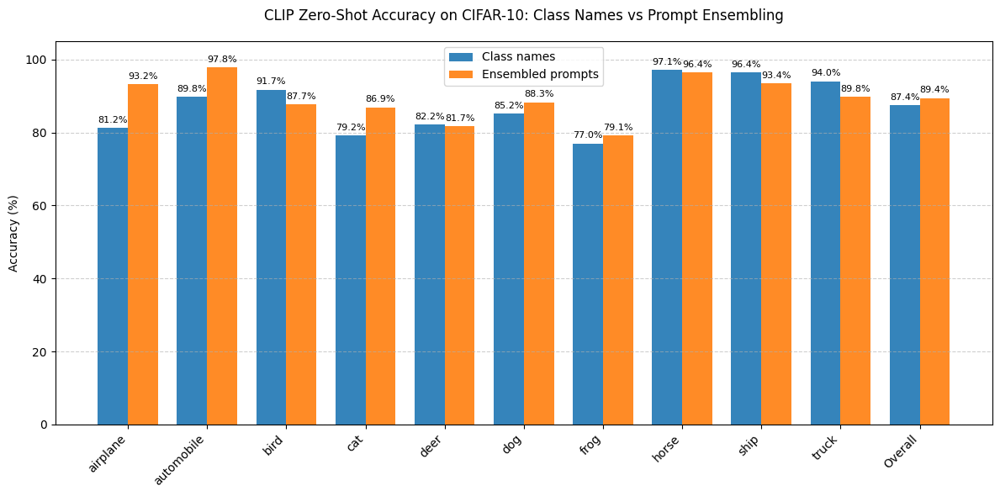

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

acc_names = {
    "airplane": 81.2, "automobile": 89.8, "bird": 91.7, "cat": 79.2,
    "deer": 82.2, "dog": 85.2, "frog": 77.0, "horse": 97.1,
    "ship": 96.4, "truck": 94.0
}

acc_ens = {
    "airplane": 93.2, "automobile": 97.8, "bird": 87.7, "cat": 86.9,
    "deer": 81.7, "dog": 88.3, "frog": 79.1, "horse": 96.4,
    "ship": 93.4, "truck": 89.8
}

classes = ["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]
y_names = np.array([acc_names[c] for c in classes])
y_ens   = np.array([acc_ens[c]   for c in classes])

overall_names = y_names.mean()
overall_ens   = y_ens.mean()
classes_with_overall = classes + ["Overall"]
y_names_with_overall = np.append(y_names, overall_names)
y_ens_with_overall   = np.append(y_ens,   overall_ens)

x = np.arange(len(classes_with_overall))
w = 0.38

plt.figure(figsize=(12,6))
b1 = plt.bar(x - w/2, y_names_with_overall, width=w, label="Class names", alpha=0.9)
b2 = plt.bar(x + w/2, y_ens_with_overall,   width=w, label="Ensembled prompts", alpha=0.9)

plt.xticks(x, classes_with_overall, rotation=45, ha="right")
plt.ylim(0, 105)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.title("CLIP Zero-Shot Accuracy on CIFAR-10: Class Names vs Prompt Ensembling", pad=18)
plt.ylabel("Accuracy (%)")
plt.legend()

for bars in (b1, b2):
    for rect in bars:
        h = rect.get_height()
        plt.text(rect.get_x() + rect.get_width()/2, h + 1, f"{h:.1f}%", ha="center", va="bottom", fontsize=8)

plt.tight_layout()
plt.show()


# Zero-Shot accuracy of CLIP on STL-10 dataset

In [ ]:
# Download STL-10 dataset and create DataLoader
stl10_test_set = datasets.STL10(root="./data", split="test", download=True, transform=preprocess)
stl10_loader = DataLoader(stl10_test_set, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
stl10_classes = stl10_test_set.classes
print(f"\nSTL-10 classes: {stl10_classes}")

# Build prompts and encode text for STL-10 classes
stl10_prompts_by_class = build_prompts(stl10_classes, TEMPLATES)
_, stl10_ensembled_text_features = encode_text_prompts(
    model, tokenizer, stl10_prompts_by_class, device
)

# Evaluate ensemble accuracy on STL-10
print("\nEvaluating zero-shot accuracy on STL-10 (no training):")
preds, true_labels = infer_zero_shot(model, stl10_loader, stl10_ensembled_text_features, device, progress_desc="STL-10")

# Calculate and print accuracy per class and overall
total_correct = 0
total_samples = 0
class_correct = {}
class_total = {}

for i in range(len(stl10_classes)):
    class_correct[i] = 0
    class_total[i] = 0

for pred, true_label in zip(preds, true_labels):
    if pred == true_label:
        total_correct += 1
        class_correct[true_label] += 1
    total_samples += 1
    class_total[true_label] += 1

print("\nAccuracy per class:")
for i, class_name in enumerate(stl10_classes):
    accuracy = (class_correct[i] / class_total[i] * 100.0) if class_total[i] > 0 else 0.0
    print(f"  {class_name}: {accuracy:.2f}% ({class_correct[i]}/{class_total[i]})")

overall_accuracy = (total_correct / total_samples * 100.0) if total_samples > 0 else 0.0
print(f"\nOverall accuracy: {overall_accuracy:.2f}% ({total_correct}/{total_samples})")

100%|██████████| 2.64G/2.64G [02:47<00:00, 15.8MB/s]



STL-10 classes: ['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck']

Evaluating zero-shot accuracy on STL-10 (no training):



Accuracy per class:
  airplane: 99.12% (793/800)
  bird: 99.75% (798/800)
  car: 97.50% (780/800)
  cat: 89.38% (715/800)
  deer: 98.12% (785/800)
  dog: 96.75% (774/800)
  horse: 98.75% (790/800)
  monkey: 97.38% (779/800)
  ship: 99.88% (799/800)
  truck: 98.62% (789/800)

Overall accuracy: 97.52% (7802/8000)


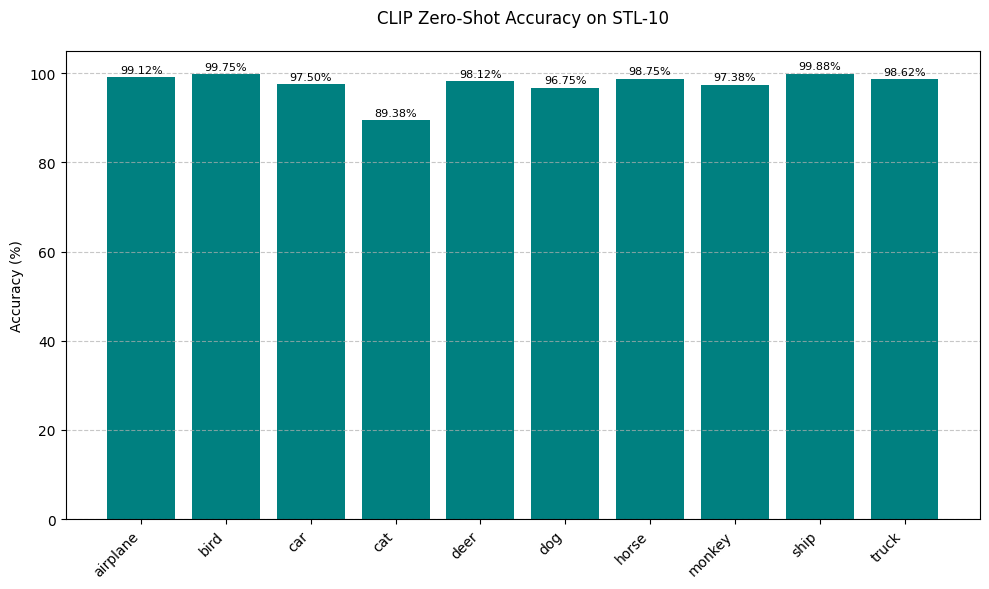

In [ ]:
import matplotlib.pyplot as plt

acc = {
    "airplane": 99.12, "bird": 99.75, "car": 97.50, "cat": 89.38,
    "deer": 98.12, "dog": 96.75, "horse": 98.75, "monkey": 97.38,
    "ship": 99.88, "truck": 98.62
}

plt.figure(figsize=(10,6))
bars = plt.bar(acc.keys(), acc.values(), color="teal")
plt.xticks(rotation=45, ha="right")
plt.ylim(0, 105)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.title("CLIP Zero-Shot Accuracy on STL-10", pad=20)
plt.ylabel("Accuracy (%)")

for b,a in zip(bars, acc.values()):
    plt.text(b.get_x()+b.get_width()/2, a+1, f"{a:.2f}%", ha="center", fontsize=8)

plt.tight_layout()
plt.show()


# EVALUATION OF ZERO SHOT ACCURACY PER TEMPLATE AND ENSEMBLED

In [ ]:
# Evaluate per-template
print("\nPer-template zero-shot accuracy on CIFAR-10 (no training):")
for k, t in enumerate(TEMPLATES):
    acc_k, _ = infer_zero_shot(model, cifar_loader, per_template_text_features[k], device, progress_desc="CIFAR-10")
    print(f"  Template {k+1:>2} | \"{t}\"  ->  Top-1 Acc: {acc_k:.2f}%")

# Evaluate ensemble (mean of prompt embeddings)
ens_acc, _ = infer_zero_shot(model, cifar_loader, ensembled_text_features, device, progress_desc="CIFAR-10")
print(f"\nEnsembled prompts -> Top-1 Acc (CIFAR-10): {ens_acc:.2f}%")


Per-template zero-shot accuracy on CIFAR-10 (no training):


  Template  1 | "a photo of the {}"  ->  Top-1 Acc: 88.88%


  Template  2 | "a picture of a {}"  ->  Top-1 Acc: 88.61%


  Template  3 | "a colorful picture of {}"  ->  Top-1 Acc: 88.14%


  Template  4 | "the painting of a {}"  ->  Top-1 Acc: 88.51%


  Template  5 | "a blurry photo of a {}"  ->  Top-1 Acc: 87.88%


  Template  6 | "a big {}"  ->  Top-1 Acc: 86.87%


  Template  7 | "a drawing of a {}"  ->  Top-1 Acc: 89.29%


  Template  8 | "a sketch of a {}"  ->  Top-1 Acc: 87.82%



Ensembled prompts -> Top-1 Acc (CIFAR-10): 89.43%


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# ENCODED 23 IMAGES OF DIVERSE DOMAINS FROM INTERNET

In [ ]:
import os
from PIL import Image
import torch
import torch.nn.functional as F
from tqdm import tqdm

image_directory = "/content/drive/MyDrive/Colab Notebooks/23-images"
image_paths = []
# Iterate through all subdirectories to find images
for root, _, files in os.walk(image_directory):
    for file in files:
        if file.lower().endswith((".jpg", ".jpeg", ".png", ".bmp", ".webp")):
            image_paths.append(os.path.join(root, file))

print(f"Found {len(image_paths)} images in {image_directory}.")

image_features = []
model.eval()
with torch.no_grad():
    for image_path in tqdm(image_paths, desc="Encoding images"):
        try:
            image = Image.open(image_path).convert("RGB")
            image_input = preprocess(image).unsqueeze(0).to(device)
            image_embedding = model.encode_image(image_input)
            image_embedding = F.normalize(image_embedding, dim=-1)
            image_features.append(image_embedding.cpu())
        except Exception as e:
            print(f"Error processing image {image_path}: {e}")

if image_features:
    image_features = torch.cat(image_features, dim=0)
    print(f"Shape of image features: {image_features.shape}")
else:
    print("No images found or processed in the directory.")

Found 23 images in /content/drive/MyDrive/Colab Notebooks/23-images.


Encoding images: 100%|██████████| 23/23 [00:21<00:00,  1.08it/s]

Shape of image features: torch.Size([23, 512])


# ENCODED HAND WRITTEN TEMPLATE TEXTS FOR COMPARISON OF RETRIVAL WITH ABOVE IMAGES AND VICE VERSA

In [ ]:
import pandas as pd

text_file_path = "/content/texts for testing.csv"
text_prompts = []

if os.path.exists(text_file_path):
    try:
        df = pd.read_csv(text_file_path, header=None)
        text_prompts = df[0].tolist()
        print(f"Loaded {len(text_prompts)} text prompts from {text_file_path}")
    except Exception as e:
        print(f"Error loading text prompts from {text_file_path}: {e}")
else:
    print(f"Error: Text file not found at {text_file_path}")

text_features = []
if text_prompts:
    with torch.no_grad():
        text_tokens = tokenizer(text_prompts).to(device)
        text_features = model.encode_text(text_tokens)
        text_features = F.normalize(text_features, dim=-1)
    print(f"Shape of text features: {text_features.shape}")
else:
    print("No text prompts loaded or processed.")

Loaded 36 text prompts from /content/texts for testing.csv
Shape of text features: torch.Size([36, 512])


# COMPUTED COSINE SIMILARITY OF IMAGES AND TEXTS

In [ ]:
similarity_matrix = image_features.to(device) @ text_features.T

print(f"Shape of similarity matrix: {similarity_matrix.shape}")

Shape of similarity matrix: torch.Size([23, 36])


# CODE TO FIND MOST SIMILAR IMAGES FOR EACH TEXT AND MOST SIMILAR TEXT FOR EACH IMAGE

In [ ]:
# Find the top N most similar text prompts for each image
def get_top_image_to_text_matches(similarity_matrix, image_paths, text_prompts, top_n=3):
    """
    Finds the top N most similar text prompts for each image.
    Returns a list of tuples: (image_path, [(score, text_prompt), ...])
    """
    top_matches = []
    for i in range(similarity_matrix.shape[0]):
        # Get the similarity scores for the current image across all text prompts
        scores = similarity_matrix[i, :]
        # Get the top N scores and their indices
        top_scores, top_indices = torch.topk(scores, top_n)
        # Get the corresponding text prompts and format the results
        image_top_matches = [(top_scores[j].item(), text_prompts[top_indices[j].item()]) for j in range(top_n)]
        top_matches.append((image_paths[i], image_top_matches))
    return top_matches

# Find the top N most similar images for each text prompt
def get_top_text_to_image_matches(similarity_matrix, image_paths, text_prompts, top_n=3):
    """
    Finds the top N most similar images for each text prompt.
    Returns a list of tuples: (text_prompt, [(score, image_path), ...])
    """
    top_matches = []
    for j in range(similarity_matrix.shape[1]):
        # Get the similarity scores for the current text prompt across all images
        scores = similarity_matrix[:, j]
        # Get the top N scores and their indices
        top_scores, top_indices = torch.topk(scores, top_n)
        # Get the corresponding image paths and format the results
        text_top_matches = [(top_scores[k].item(), image_paths[top_indices[k].item()]) for k in range(top_n)]
        top_matches.append((text_prompts[j], text_top_matches))
    return top_matches

# Get top 5 matches for both
top_n = 5
image_to_text_matches = get_top_image_to_text_matches(similarity_matrix, image_paths, text_prompts, top_n)
text_to_image_matches = get_top_text_to_image_matches(similarity_matrix, image_paths, text_prompts, top_n)

print(f"Found top {top_n} text matches for each of {len(image_paths)} images.")
print(f"Found top {top_n} image matches for each of {len(text_prompts)} text prompts.")

Found top 5 text matches for each of 23 images.
Found top 5 image matches for each of 36 text prompts.


# VISULAIZING MATCH RESULTS


--- Top Image to Text Matches ---

Top 2 text matches for Image: caption-me.jpg


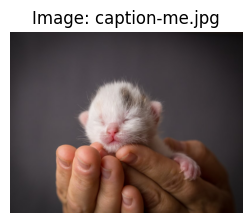

  - Score: 0.3071, Text: "cute kitten in hand"
  - Score: 0.2827, Text: "baby kitten playing"

Top 2 text matches for Image: baby kitten.jpeg


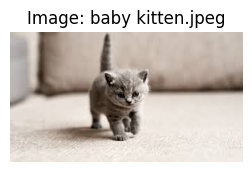

  - Score: 0.2930, Text: "cute kitten"
  - Score: 0.2905, Text: "baby kitten playing"

Top 2 text matches for Image: 4 cats watching.jpg


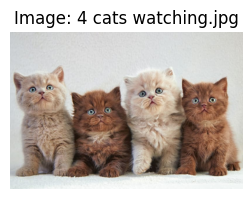

  - Score: 0.2710, Text: "cute kitten"
  - Score: 0.2539, Text: "a happy group of people"

Top 2 text matches for Image: loving my cat.jpeg


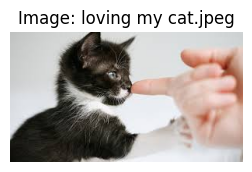

  - Score: 0.3123, Text: "cute kitten in hand"
  - Score: 0.2935, Text: "baby kitten playing"

Top 2 text matches for Image: cats cuddling.webp


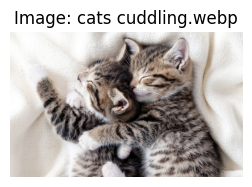

  - Score: 0.3032, Text: "cats cuddling"
  - Score: 0.2803, Text: "identical cats cuddling"

Top 2 text matches for Image: kitten and bunny buddies.jpg


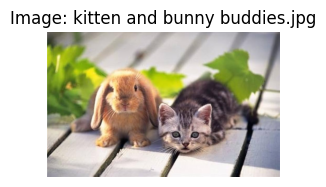

  - Score: 0.3286, Text: "kitten and bunny buddies"
  - Score: 0.3047, Text: "kitten and bunny playing"

Top 2 text matches for Image: painting-showing-nature-colors-and-peace.jpg


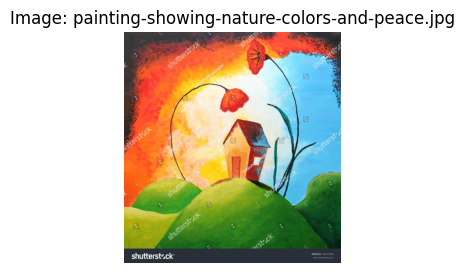

  - Score: 0.2761, Text: "painting of spring"
  - Score: 0.2686, Text: "painting of summer"

Top 2 text matches for Image: spring painting.jpg


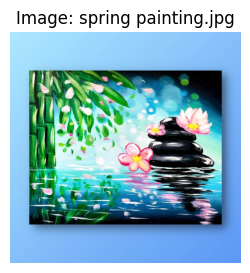

  - Score: 0.2812, Text: "painting of spring"
  - Score: 0.2747, Text: "painting of summer"

Top 2 text matches for Image: people working in office.webp


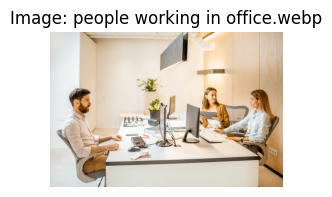

  - Score: 0.2476, Text: "office workers"
  - Score: 0.2311, Text: "office meeting"

Top 2 text matches for Image: people working in kitchen.jpg


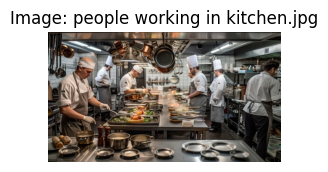

  - Score: 0.2654, Text: "kitchen crew"
  - Score: 0.2340, Text: "people working"

Top 2 text matches for Image: a happy person.jpg


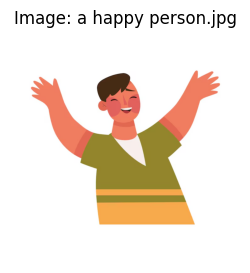

  - Score: 0.2637, Text: "a happy person"
  - Score: 0.2305, Text: "a cartoon"

Top 2 text matches for Image: a happy group.jpg


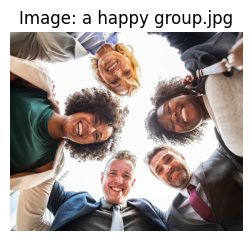

  - Score: 0.2363, Text: "a happy group of people"
  - Score: 0.2244, Text: "office workers"

Top 2 text matches for Image: a glass of water.jpg


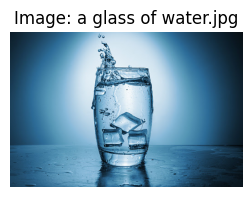

  - Score: 0.2959, Text: "a glass of water"
  - Score: 0.2462, Text: "a glass of milk"

Top 2 text matches for Image: a glass of milk.jpg


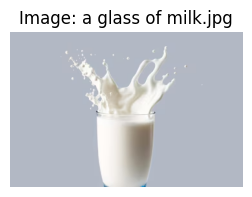

  - Score: 0.3174, Text: "a glass of milk"
  - Score: 0.3052, Text: "spilling milk"

Top 2 text matches for Image: beautiful charming red rose.jpg


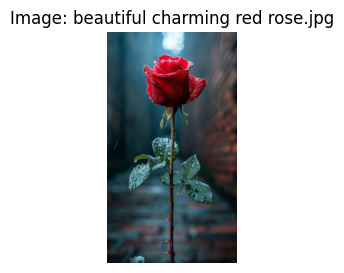

  - Score: 0.3083, Text: "Beautiful charming red rose"
  - Score: 0.2708, Text: "a photo of a flower"

Top 2 text matches for Image: oriental lilly.jpg


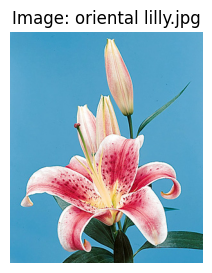

  - Score: 0.3264, Text: "oriental lilly"
  - Score: 0.2893, Text: "a photo of a flower"

Top 2 text matches for Image: baby breath.webp


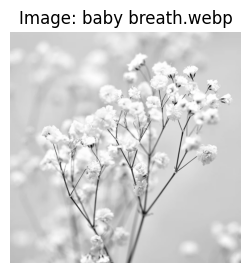

  - Score: 0.2905, Text: "flowers in winter"
  - Score: 0.2874, Text: "baby breath"

Top 2 text matches for Image: a sketch of a dress.jpg


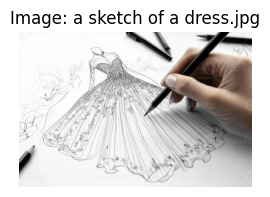

  - Score: 0.2983, Text: "a sketch of a dress"
  - Score: 0.2754, Text: "a photo of a dress"

Top 2 text matches for Image: a drawing of a girl.jpeg


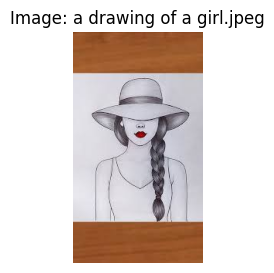

  - Score: 0.2471, Text: "a sketch of a dress"
  - Score: 0.2397, Text: "a happy person"

Top 2 text matches for Image: an anime.jpg


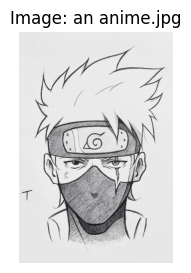

  - Score: 0.3452, Text: "kakashi hatake"
  - Score: 0.2458, Text: "an anime"

Top 2 text matches for Image: a depressed man.png


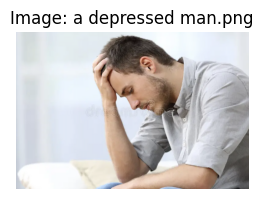

  - Score: 0.2839, Text: "a depressed person"
  - Score: 0.2812, Text: "a depressed man"

Top 2 text matches for Image: pouring-fresh-milk-into-glass.jpg.webp


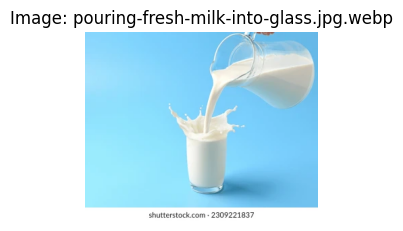

  - Score: 0.3225, Text: "a glass of milk"
  - Score: 0.3127, Text: "spilling milk"

Top 2 text matches for Image: glass crockery.jpg


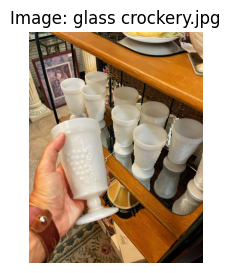

  - Score: 0.2615, Text: "a glass of milk"
  - Score: 0.2603, Text: "spilling milk"

--- Top Text to Image Matches ---

Top 2 image matches for Text: "a glass of water"


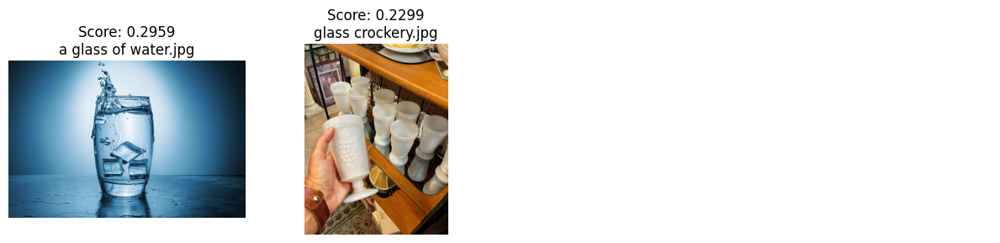


Top 2 image matches for Text: "a glass of milk"


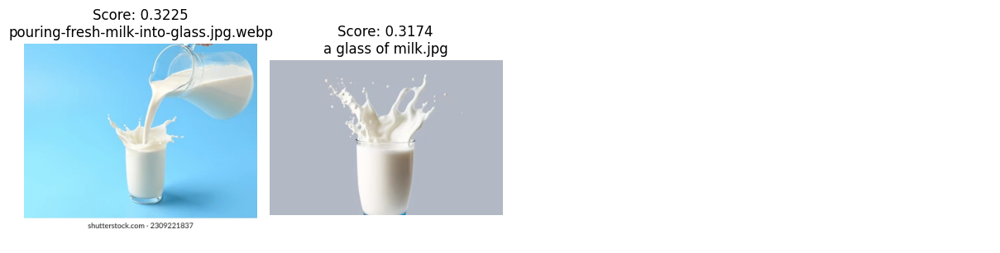


Top 2 image matches for Text: "spilling milk"


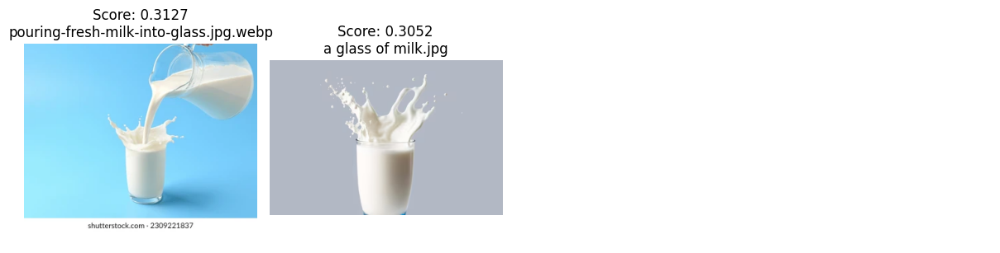


Top 2 image matches for Text: "a happy group of people"


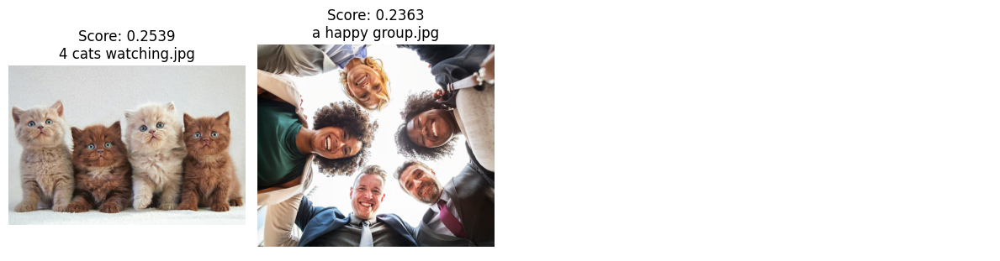


Top 2 image matches for Text: "a sad group of people"


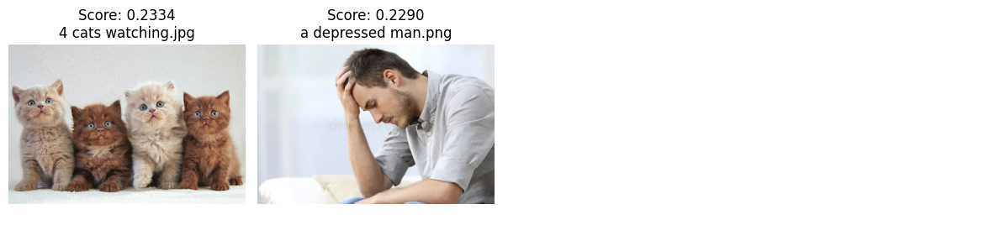


Top 2 image matches for Text: "a sketch of a dress"


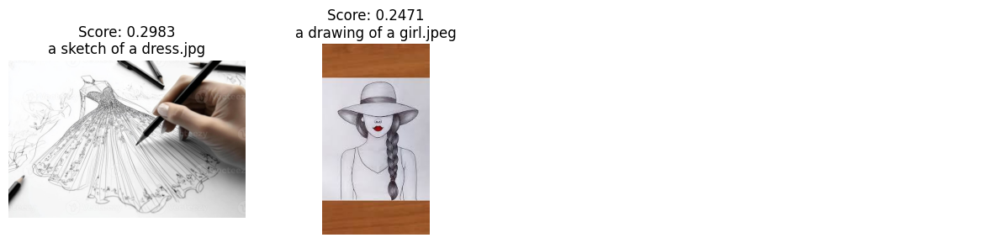


Top 2 image matches for Text: "a photo of a dress"


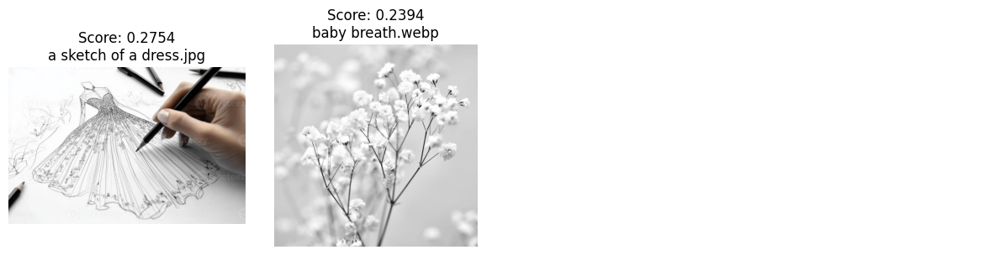


Top 2 image matches for Text: "a cartoon"


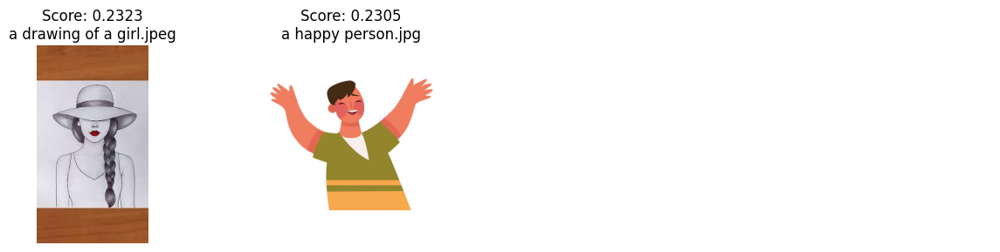


Top 2 image matches for Text: "an anime"


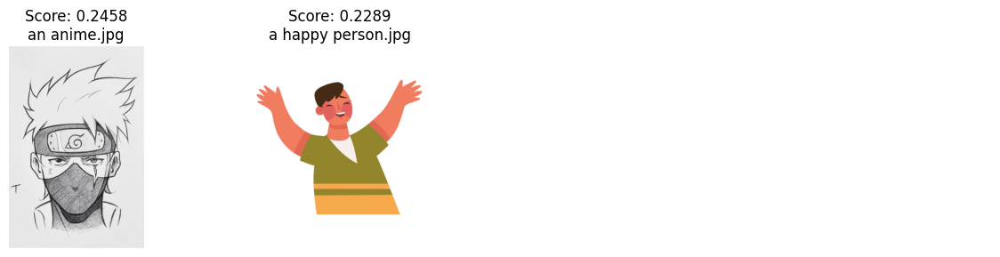


Top 2 image matches for Text: "kakashi hatake"


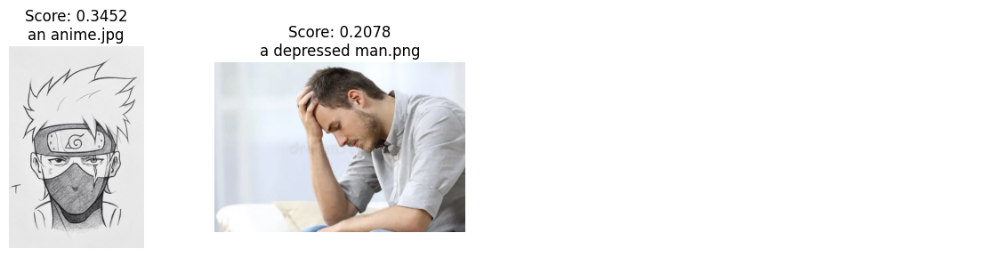


Top 2 image matches for Text: "a photo of a flower"


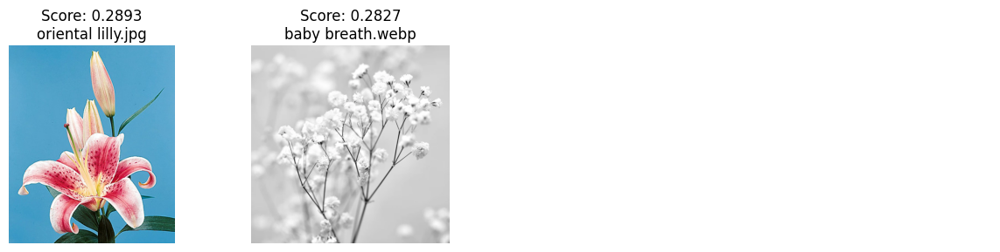


Top 2 image matches for Text: "flowers in winter"


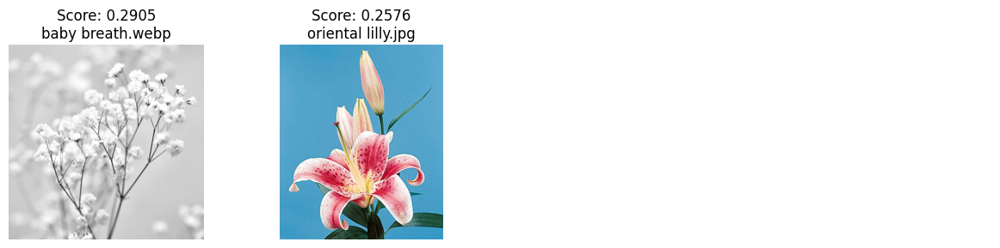


Top 2 image matches for Text: "baby breath"


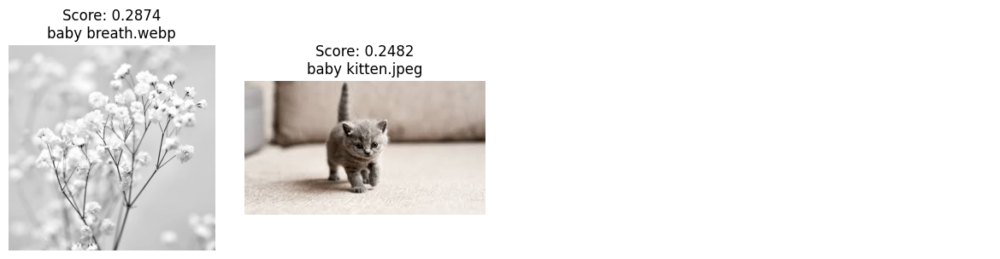


Top 2 image matches for Text: "a depressed person"


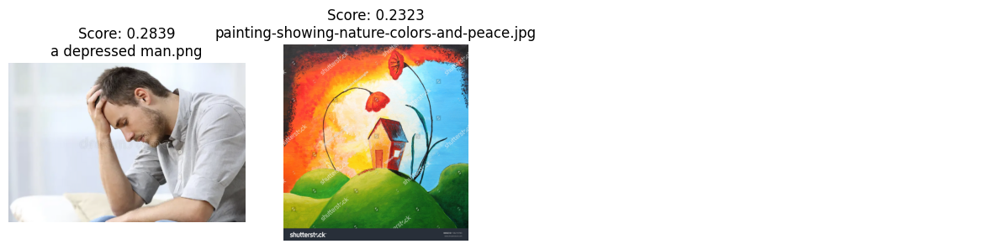


Top 2 image matches for Text: "a depressed man"


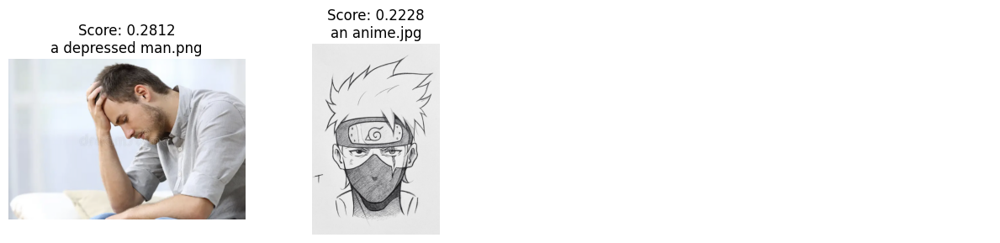


Top 2 image matches for Text: "a happy person"


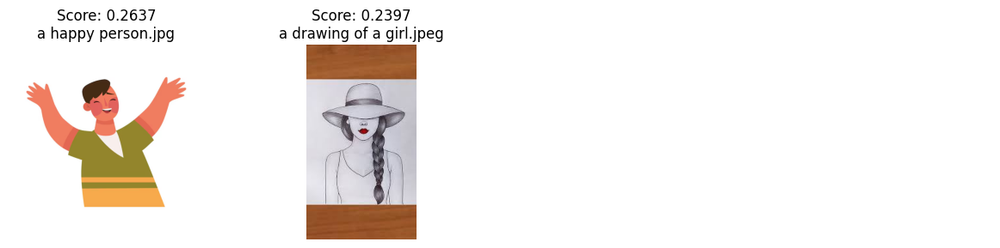


Top 2 image matches for Text: "baby kitten playing"


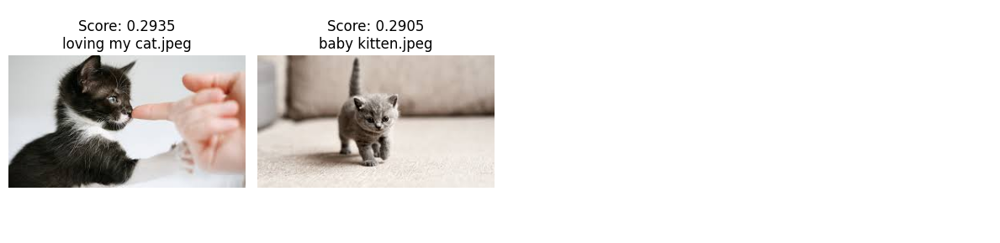


Top 2 image matches for Text: "Beautiful charming red rose"


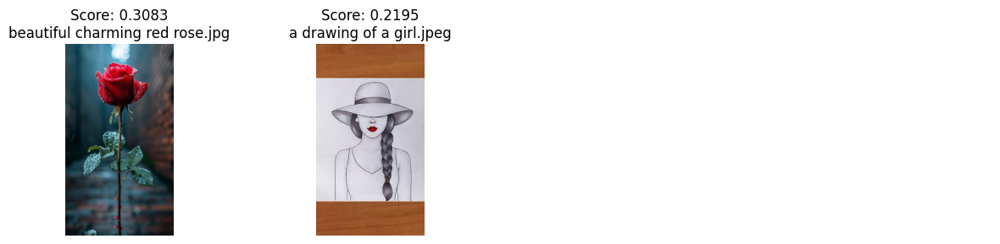


Top 2 image matches for Text: "cute kitten in hand"


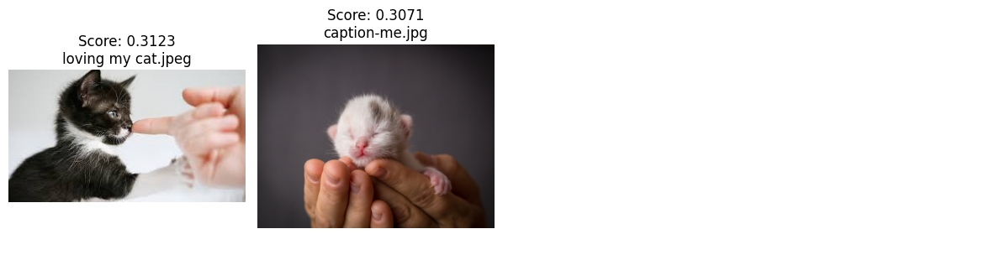


Top 2 image matches for Text: "cute kitten"


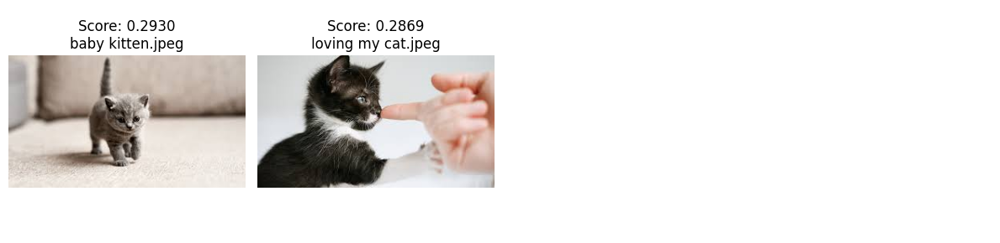


Top 2 image matches for Text: "cats cuddling"


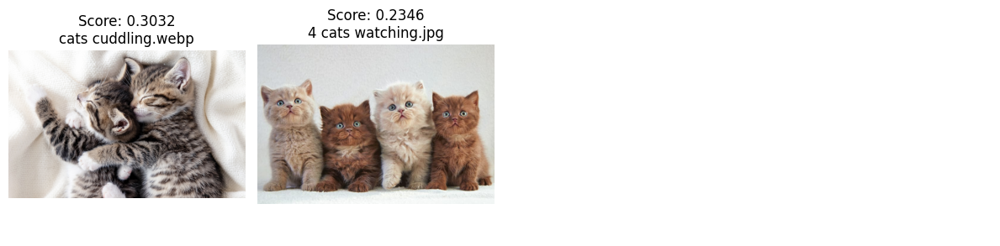


Top 2 image matches for Text: "identical cats cuddling"


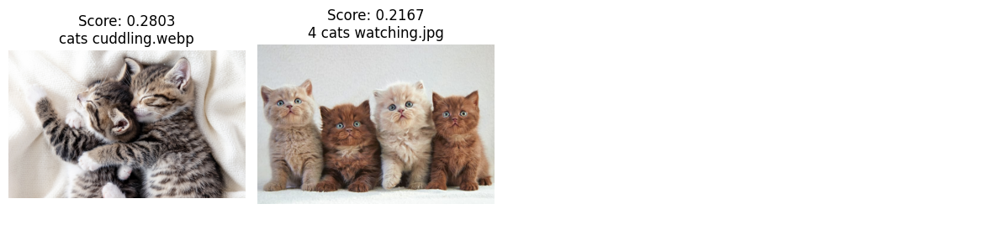


Top 2 image matches for Text: "kitten and bunny buddies"


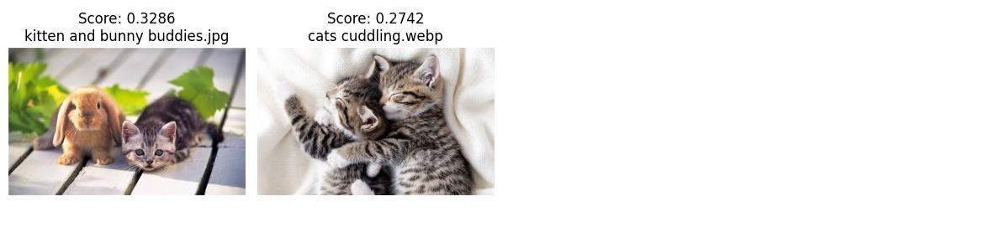


Top 2 image matches for Text: "kitten and bunny playing"


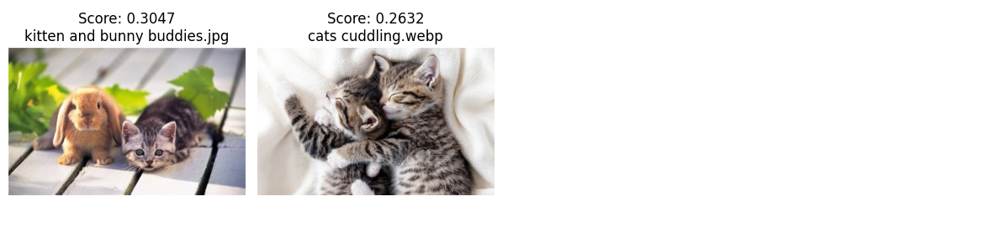


Top 2 image matches for Text: "loving my cat"


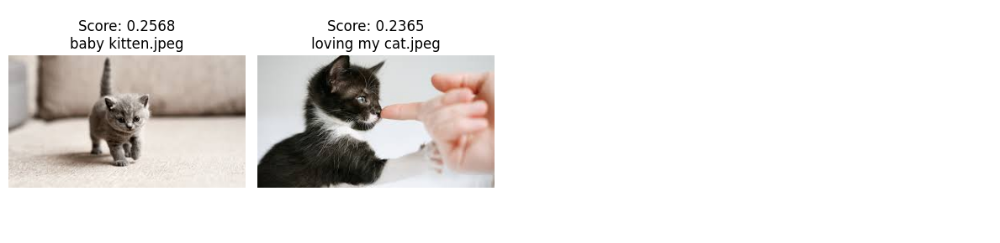


Top 2 image matches for Text: "my precious little kitten"


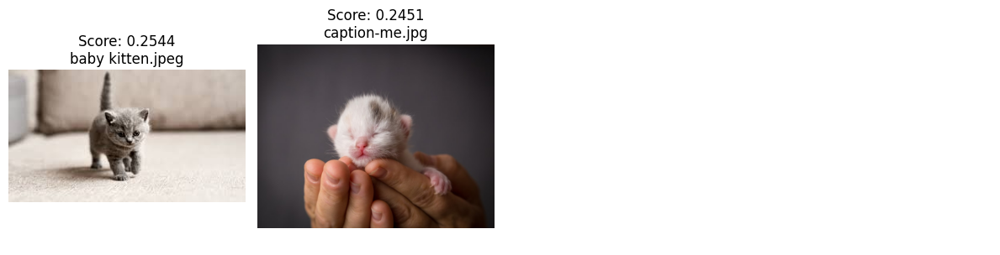


Top 2 image matches for Text: "oriental lilly"


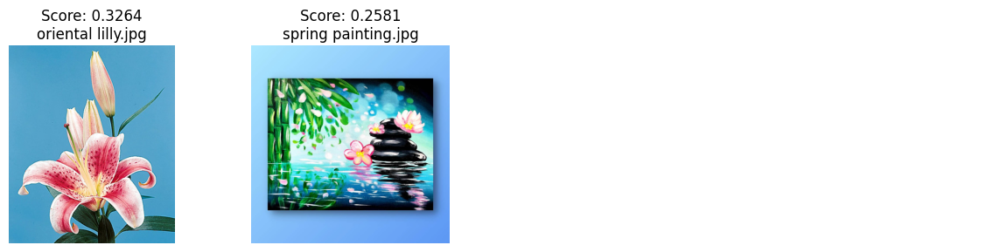


Top 2 image matches for Text: "lilly my love"


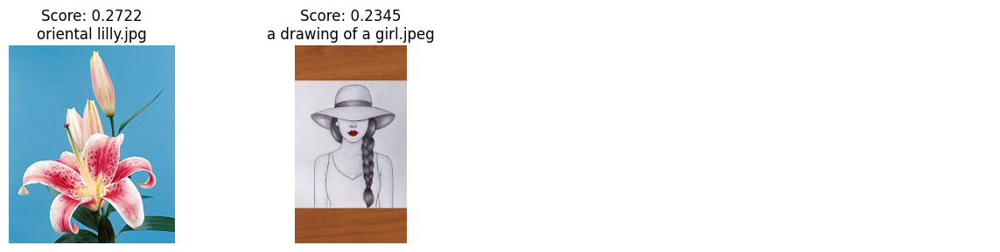


Top 2 image matches for Text: "painting of summer"


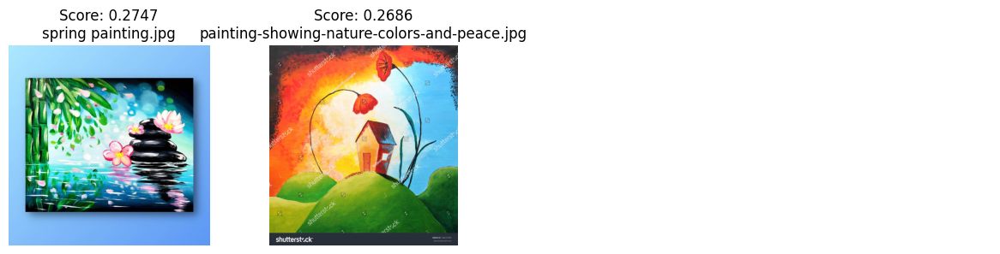


Top 2 image matches for Text: "painting of spring"


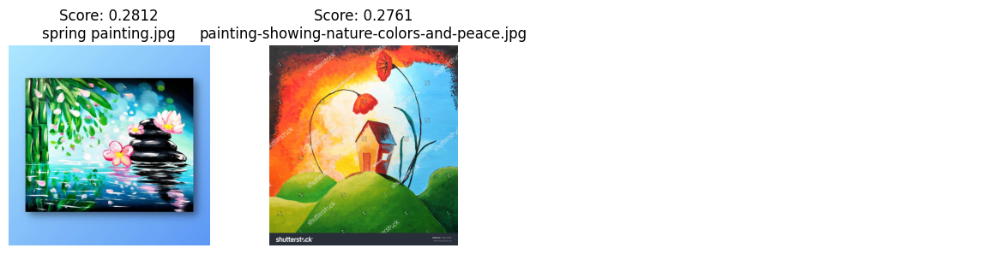


Top 2 image matches for Text: "painting of autumn"


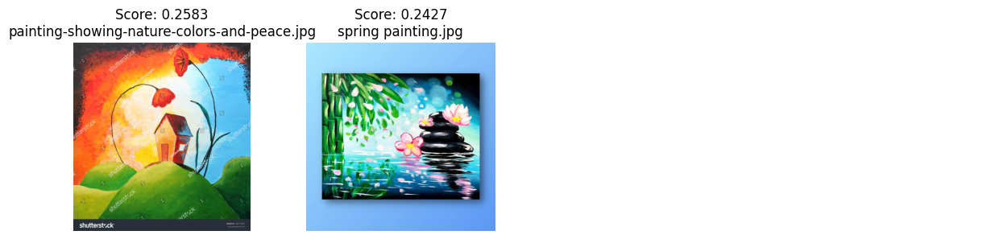


Top 2 image matches for Text: "painting of winter"


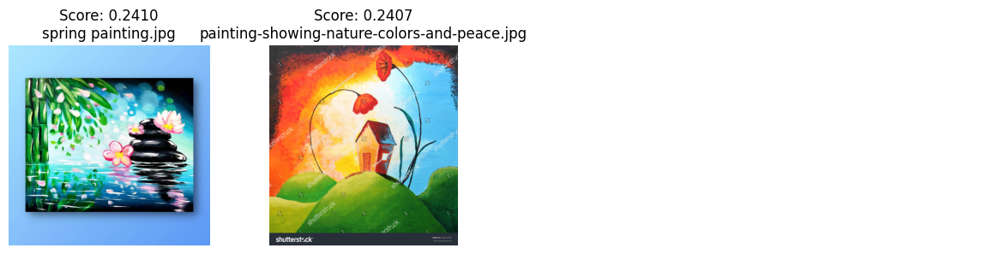


Top 2 image matches for Text: "people working"


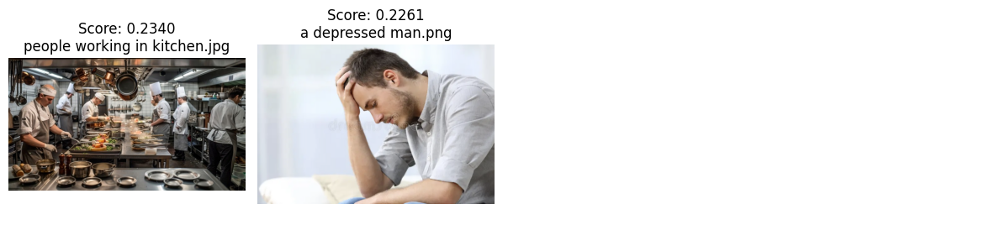


Top 2 image matches for Text: "kitchen crew"


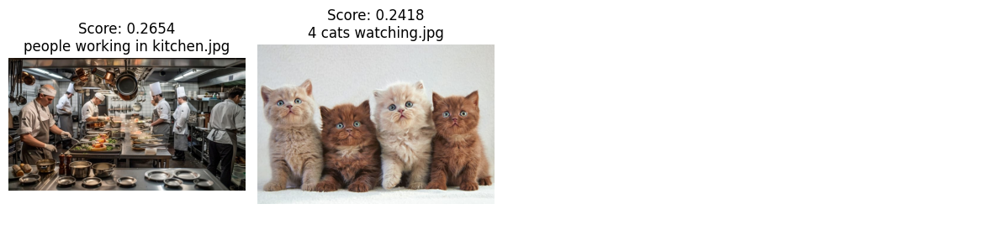


Top 2 image matches for Text: "office workers"


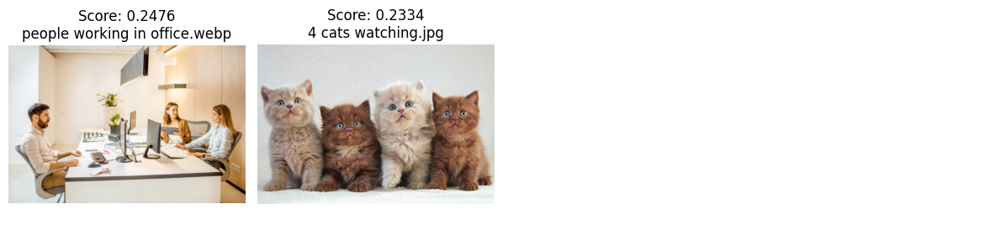


Top 2 image matches for Text: "office meeting"


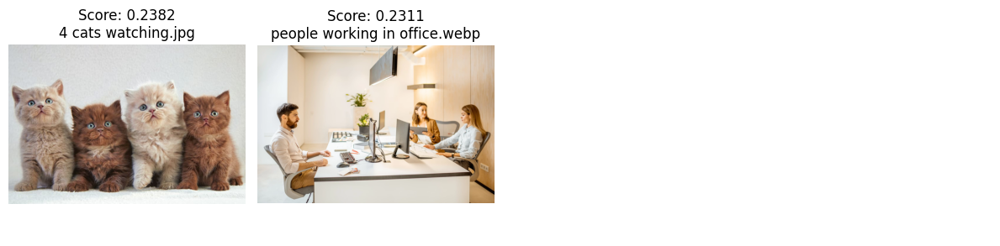

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math

# Function to display image and text matches with grid layout
def display_matches_grid(matches, title, is_image_to_text=True, top_n=2, cols=4):
    print(f"\n--- {title} ---")
    num_items = len(matches)

    for i, (item, top_matches) in enumerate(matches):
        if is_image_to_text:
            print(f"\nTop {top_n} text matches for Image: {os.path.basename(item)}")
            try:
                img = Image.open(item)
                plt.figure(figsize=(3, 3)) # Fixed size for image display
                plt.imshow(img)
                plt.title(f"Image: {os.path.basename(item)}")
                plt.axis('off')
                plt.show()

                for score, text in top_matches[:top_n]:
                    print(f"  - Score: {score:.4f}, Text: \"{text}\"")

            except Exception as e:
                print(f"Could not display image {os.path.basename(item)}: {e}")


        else:
            print(f"\nTop {top_n} image matches for Text: \"{item}\"")
            # Calculate number of rows needed for images based on cols
            img_rows = math.ceil(top_n / cols)
            fig, axs = plt.subplots(img_rows, cols, figsize=(cols * 3, img_rows * 3)) # Create subplot grid

            # Flatten axs if it's a 2D array
            if img_rows > 1:
                axs = axs.flatten()
            elif cols > 1:
                axs = axs

            for j in range(len(axs)):
                 if j < top_n:
                    score, image_path = top_matches[j]
                    try:
                        img = Image.open(image_path)
                        axs[j].imshow(img)
                        axs[j].set_title(f"Score: {score:.4f}\n{os.path.basename(image_path)}")
                        axs[j].axis('off')
                    except Exception as e:
                       print(f"Could not display image {os.path.basename(image_path)}: {e}")
                       axs[j].set_title("Error loading image")
                       axs[j].axis('off')
                 else:
                    # Hide unused subplots
                    axs[j].axis('off')

            plt.tight_layout()
            plt.show()


# Display top image-to-text matches
display_matches_grid(image_to_text_matches, "Top Image to Text Matches", is_image_to_text=True, top_n=2, cols=4)

# Display top text-to-image matches
display_matches_grid(text_to_image_matches, "Top Text to Image Matches", is_image_to_text=False, top_n=2, cols=4)

In [ ]:
!pip install opendatasets

In [ ]:
import opendatasets as od
od.download("https://www.kaggle.com/datasets/ma3ple/pacs-dataset/data?select=kfold")


Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: aizelsheikh
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/ma3ple/pacs-dataset


100%|██████████| 176M/176M [00:00<00:00, 582MB/s] 

# DOWNLOADING AND VISUALIZING PACS DATASET

Domain: art_painting
  Class: guitar -> 184 images
  Class: horse -> 201 images
  Class: elephant -> 255 images
  Class: giraffe -> 285 images
  Class: person -> 449 images
  Class: house -> 295 images
  Class: dog -> 379 images
Domain: photo
  Class: guitar -> 186 images
  Class: horse -> 199 images
  Class: elephant -> 202 images
  Class: giraffe -> 182 images
  Class: person -> 432 images
  Class: house -> 280 images
  Class: dog -> 189 images
Domain: sketch
  Class: guitar -> 608 images
  Class: horse -> 816 images
  Class: elephant -> 740 images
  Class: giraffe -> 753 images
  Class: person -> 160 images
  Class: house -> 80 images
  Class: dog -> 772 images
Domain: cartoon
  Class: guitar -> 135 images
  Class: horse -> 324 images
  Class: elephant -> 457 images
  Class: giraffe -> 346 images
  Class: person -> 405 images
  Class: house -> 288 images
  Class: dog -> 389 images


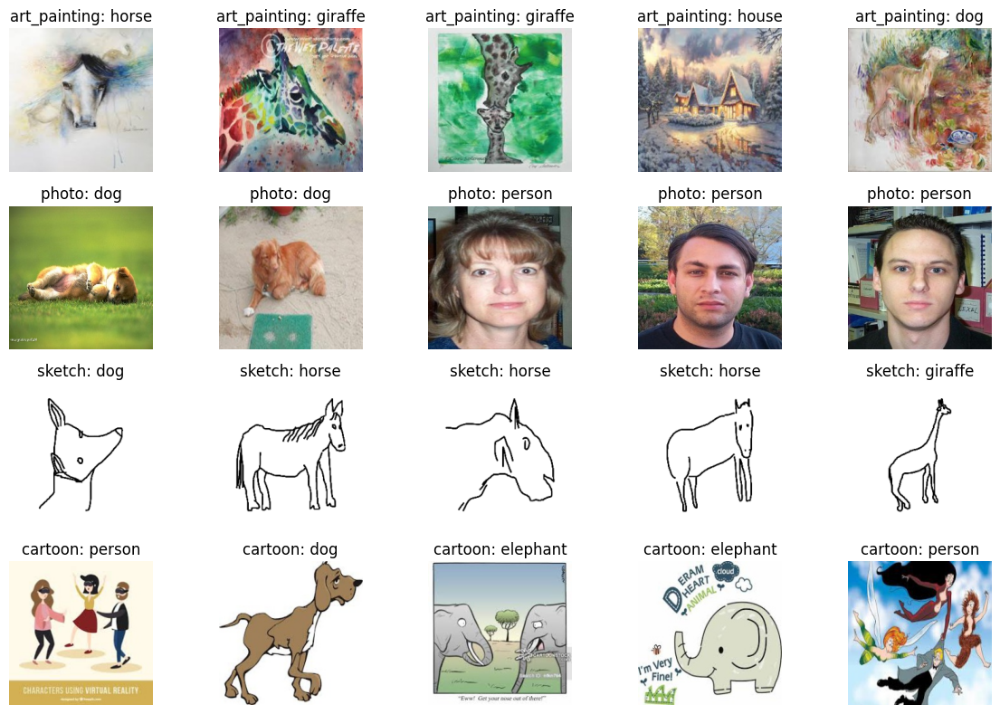

In [ ]:
data_path = "/content/pacs-dataset/kfold"

domains = os.listdir(data_path)
classes = os.listdir(os.path.join(data_path, domains[0]))

num_samples = 5
fig, axes = plt.subplots(len(os.listdir(data_path)), num_samples, figsize=(12, 8))

for i, domain in enumerate(domains):
    domain_path = os.path.join(data_path, domain)
    images = []
    print(f"Domain: {domain}")
    for cls in classes:
        cls_path = os.path.join(domain_path, cls)
        count = len(os.listdir(cls_path))
        images += [os.path.join(cls_path, img) for img in os.listdir(cls_path)]
        print(f"  Class: {cls} -> {count} images")

    selected_images = random.sample(images, num_samples)

    for j, image_path in enumerate(selected_images):
        img = plt.imread(image_path)
        axes[i, j].imshow(img)
        axes[i, j].axis("off")
        axes[i, j].set_title(f"{domain}: {os.path.basename(os.path.dirname(image_path))}")

plt.tight_layout()
plt.show()

# Infer zero-shot accuracy on PACS

In [ ]:
class PACSDataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, domain, preprocess):
        self.samples = []
        self.classes = []
        self.class_to_idx = {}
        self.preprocess = preprocess
        domain_path = os.path.join(root_dir, domain)

        if not os.path.isdir(domain_path):
            raise FileNotFoundError(f"Domain path not found: {domain_path}")

        # Get classes from the first domain's directory structure
        # Assumes all domains have the same class structure
        class_names = sorted(os.listdir(domain_path))

        for cname in class_names:
            cpath = os.path.join(domain_path, cname)
            if not os.path.isdir(cpath):
                continue
            if cname not in self.class_to_idx:
                self.class_to_idx[cname] = len(self.classes)
                self.classes.append(cname)
            for fname in os.listdir(cpath):
                if fname.lower().endswith((".jpg", ".jpeg", ".png", ".bmp", ".webp")):
                    self.samples.append((os.path.join(cpath, fname), self.class_to_idx[cname]))


    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, target = self.samples[idx]
        img = Image.open(path).convert("RGB")
        img = self.preprocess(img)
        return img, target

# Define the root path for the PACS dataset
data_path = "/content/pacs-dataset/kfold"

# Define the domains to evaluate
domains = ["art_painting", "photo", "sketch", "cartoon"]


# Evaluate on all four domains
for eval_domain in domains:
    try:
        pacs_dataset = PACSDataset(data_path, eval_domain, preprocess)
        pacs_loader = DataLoader(pacs_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        pacs_classes = pacs_dataset.classes
        print(f"\nEvaluating on PACS domain: {eval_domain}")
        print(f"PACS classes: {pacs_classes}")

        # Build prompts and encode text for PACS classes
        pacs_prompts_by_class = build_prompts(pacs_classes, TEMPLATES)
        _, pacs_ensembled_text_features = encode_text_prompts(
            model, tokenizer, pacs_prompts_by_class, device
        )

        # Evaluate ensemble accuracy on PACS
        print(f"\nEvaluating zero-shot accuracy on PACS ({eval_domain}):")
        preds, true_labels = infer_zero_shot(model, pacs_loader, pacs_ensembled_text_features, device, progress_desc=f"PACS ({eval_domain})")

        # Calculate and print accuracy per class and overall
        total_correct = 0
        total_samples = 0
        class_correct = {}
        class_total = {}

        for i in range(len(pacs_classes)):
            class_correct[i] = 0
            class_total[i] = 0

        for pred, true_label in zip(preds, true_labels):
            if pred == true_label:
                total_correct += 1
                class_correct[true_label] += 1
            total_samples += 1
            class_total[true_label] += 1

        print("\nAccuracy per class:")
        for i, class_name in enumerate(pacs_classes):
            accuracy = (class_correct[i] / class_total[i] * 100.0) if class_total[i] > 0 else 0.0
            print(f"  {class_name}: {accuracy:.2f}% ({class_correct[i]}/{class_total[i]})")

        overall_accuracy = (total_correct / total_samples * 100.0) if total_samples > 0 else 0.0
        print(f"\nOverall accuracy: {overall_accuracy:.2f}% ({total_correct}/{total_samples})")

    except FileNotFoundError as e:
        print(f"\n[WARN] {e}. Skipping domain '{eval_domain}'.")
    except Exception as e:
        print(f"\n[ERROR] An error occurred during evaluation of domain '{eval_domain}': {e}")


Evaluating on PACS domain: art_painting
PACS classes: ['dog', 'elephant', 'giraffe', 'guitar', 'horse', 'house', 'person']

Evaluating zero-shot accuracy on PACS (art_painting):



Accuracy per class:
  dog: 94.20% (357/379)
  elephant: 94.90% (242/255)
  giraffe: 97.89% (279/285)
  guitar: 96.20% (177/184)
  horse: 98.51% (198/201)
  house: 99.66% (294/295)
  person: 95.32% (428/449)

Overall accuracy: 96.44% (1975/2048)

Evaluating on PACS domain: photo
PACS classes: ['dog', 'elephant', 'giraffe', 'guitar', 'horse', 'house', 'person']

Evaluating zero-shot accuracy on PACS (photo):



Accuracy per class:
  dog: 99.47% (188/189)
  elephant: 100.00% (202/202)
  giraffe: 100.00% (182/182)
  guitar: 100.00% (186/186)
  horse: 98.99% (197/199)
  house: 100.00% (280/280)
  person: 100.00% (432/432)

Overall accuracy: 99.82% (1667/1670)

Evaluating on PACS domain: sketch
PACS classes: ['dog', 'elephant', 'giraffe', 'guitar', 'horse', 'house', 'person']

Evaluating zero-shot accuracy on PACS (sketch):



Accuracy per class:
  dog: 73.06% (564/772)
  elephant: 90.68% (671/740)
  giraffe: 67.73% (510/753)
  guitar: 98.68% (600/608)
  horse: 98.53% (804/816)
  house: 98.75% (79/80)
  person: 94.38% (151/160)

Overall accuracy: 86.00% (3379/3929)

Evaluating on PACS domain: cartoon
PACS classes: ['dog', 'elephant', 'giraffe', 'guitar', 'horse', 'house', 'person']

Evaluating zero-shot accuracy on PACS (cartoon):



Accuracy per class:
  dog: 97.69% (380/389)
  elephant: 99.78% (456/457)
  giraffe: 98.84% (342/346)
  guitar: 100.00% (135/135)
  horse: 95.68% (310/324)
  house: 99.65% (287/288)
  person: 96.05% (389/405)

Overall accuracy: 98.08% (2299/2344)


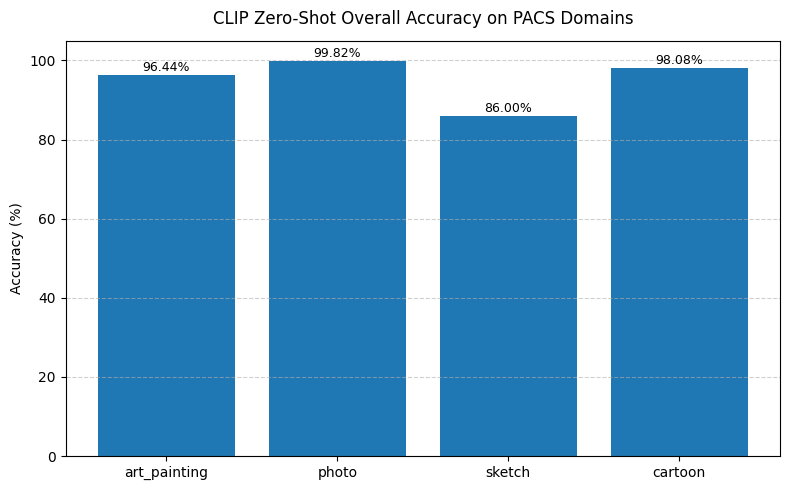

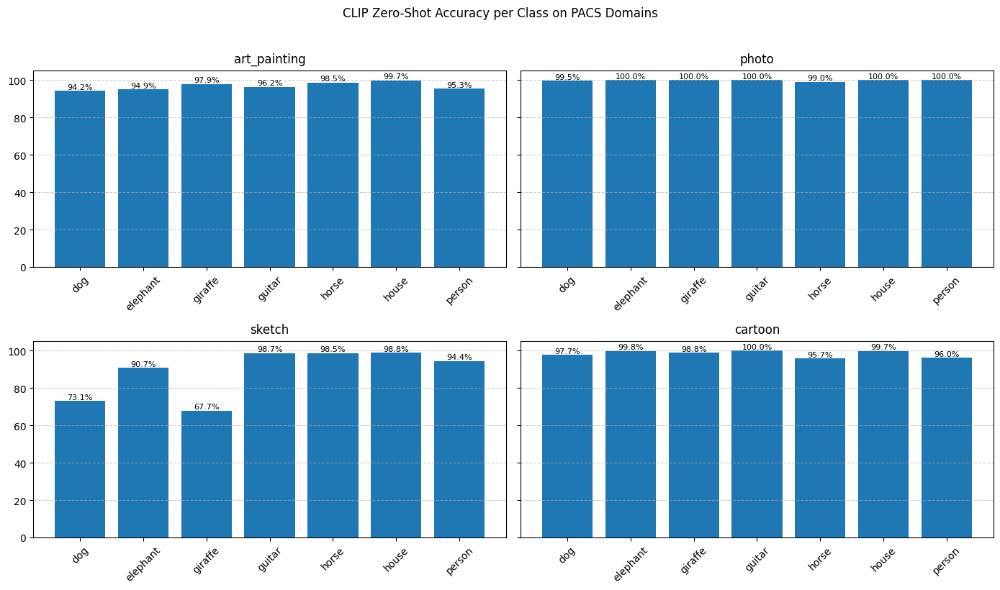

In [ ]:
import matplotlib.pyplot as plt

pacs = {
    "art_painting": {
        "overall": 96.44,
        "per_class": {"dog":94.20,"elephant":94.90,"giraffe":97.89,"guitar":96.20,"horse":98.51,"house":99.66,"person":95.32}
    },
    "photo": {
        "overall": 99.82,
        "per_class": {"dog":99.47,"elephant":100.00,"giraffe":100.00,"guitar":100.00,"horse":98.99,"house":100.00,"person":100.00}
    },
    "sketch": {
        "overall": 86.00,
        "per_class": {"dog":73.06,"elephant":90.68,"giraffe":67.73,"guitar":98.68,"horse":98.53,"house":98.75,"person":94.38}
    },
    "cartoon": {
        "overall": 98.08,
        "per_class": {"dog":97.69,"elephant":99.78,"giraffe":98.84,"guitar":100.00,"horse":95.68,"house":99.65,"person":96.05}
    },
}

domains = list(pacs.keys())
overall = [pacs[d]["overall"] for d in domains]

plt.figure(figsize=(8,5))
bars = plt.bar(domains, overall)
plt.ylim(0,105); plt.ylabel("Accuracy (%)")
plt.title("CLIP Zero-Shot Overall Accuracy on PACS Domains", pad=12)
plt.grid(axis="y", linestyle="--", alpha=0.6)
for b,a in zip(bars, overall):
    plt.text(b.get_x()+b.get_width()/2, a+1, f"{a:.2f}%", ha="center", fontsize=9)
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 2, figsize=(14,8), sharey=True)
axes = axes.ravel()
for ax, dom in zip(axes, domains):
    classes, accs = zip(*pacs[dom]["per_class"].items())
    bars = ax.bar(classes, accs)
    ax.set_title(f"{dom}", pad=8)
    ax.set_ylim(0,105); ax.grid(axis="y", linestyle="--", alpha=0.6)
    for b,a in zip(bars, accs):
        ax.text(b.get_x()+b.get_width()/2, a+1, f"{a:.1f}%", ha="center", fontsize=8)
    ax.tick_params(axis="x", rotation=45)

fig.suptitle("CLIP Zero-Shot Accuracy per Class on PACS Domains", y=1.02, fontsize=12)
plt.tight_layout()
plt.show()


# UPLOADED DIVERSE DOMAIN IMAGES FOR REPRESENTATION ANALYSIS

In [ ]:
image_directory = "/content/drive/MyDrive/Colab Notebooks/representation-analysis"
image_paths = []
image_labels = []

if os.path.exists(image_directory):
    for root, _, files in os.walk(image_directory):
        for file in files:
            if file.lower().endswith((".jpg", ".jpeg", ".png", ".bmp", ".webp")):
                image_path = os.path.join(root, file)
                image_paths.append(image_path)

                filename_without_ext = os.path.splitext(file)[0]
                label = filename_without_ext.split('-')[0]
                image_labels.append(label)

    print(f"Found {len(image_paths)} images and {len(image_labels)} labels in {image_directory}.")
else:
    print(f"Error: Image directory not found at {image_directory}")


Found 47 images and 47 labels in /content/drive/MyDrive/Colab Notebooks/representation-analysis.


# ENCODED IMAGES

In [ ]:
image_features = []
model.eval()
with torch.no_grad():
    for image_path in tqdm(image_paths, desc="Encoding images"):
        try:
            image = Image.open(image_path).convert("RGB")
            image_input = preprocess(image).unsqueeze(0).to(device)
            image_embedding = model.encode_image(image_input)
            image_embedding = F.normalize(image_embedding, dim=-1)
            image_features.append(image_embedding.cpu())
        except Exception as e:
            print(f"Error processing image {image_path}: {e}")

if image_features:
    image_features = torch.cat(image_features, dim=0)
    print(f"Shape of image features: {image_features.shape}")
else:
    print("No images successfully encoded.")

Encoding images: 100%|██████████| 47/47 [00:42<00:00,  1.10it/s]

Shape of image features: torch.Size([47, 512])


In [ ]:
# Check if image_features is already a tensor, otherwise concatenate
if isinstance(image_features, list):
    image_features_tensor = torch.cat(image_features, dim=0)
else:
    image_features_tensor = image_features

# Convert the tensor to a NumPy array for t-SNE
image_features_np = image_features_tensor.numpy()

n_samples = image_features_np.shape[0]

# Initialize t-SNE reducer with a smaller perplexity if n_samples is small
perplexity_value = min(30, max(1, n_samples - 1)) # Perplexity must be > 0 and < n_samples
tsne_reducer = TSNE(n_components=2, random_state=SEED, perplexity=perplexity_value)


# Fit and transform the image features to 2D
reduced_image_features = tsne_reducer.fit_transform(image_features_np)

# Print the shape of the reduced image features
print(f"Shape of reduced image features: {reduced_image_features.shape}")

Shape of reduced image features: (47, 2)


# REPRESENTATION ANALYSIS PROVES SHAPE BIAS VS COLOR IN CLIP. CLIP HAS LEARNT SEMANTICS

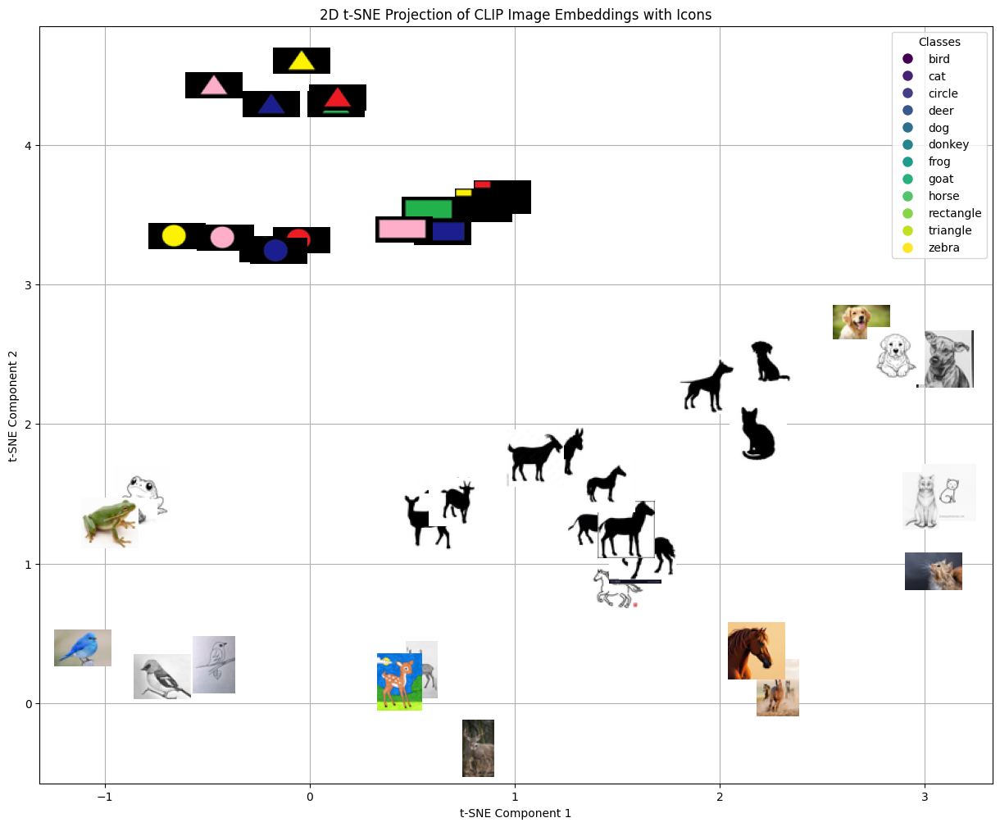

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
import numpy as np

plt.figure(figsize=(15, 12))

# Create a mapping from unique labels to numerical indices for coloring
unique_labels = sorted(list(set(image_labels)))
label_to_index = {label: i for i, label in enumerate(unique_labels)}
color_labels = [label_to_index[label] for label in image_labels]

# Scatter plot for reference (optional, can be removed if only showing images)
plt.scatter(reduced_image_features[:, 0], reduced_image_features[:, 1], c=color_labels, cmap='viridis', s=0, alpha=0) # s=0 and alpha=0 hides the points

ax = plt.gca()
ax.set_title("2D t-SNE Projection of CLIP Image Embeddings with Icons")
ax.set_xlabel("t-SNE Component 1")
ax.set_ylabel("t-SNE Component 2")
ax.grid(True)

# Add image icons
for i, (x, y) in enumerate(reduced_image_features):
    try:
        img = Image.open(image_paths[i]).convert("RGB")
        # Resize image for icon
        img.thumbnail((50, 50), Image.Resampling.LANCZOS) # Resize to 50x50 while maintaining aspect ratio

        imagebox = OffsetImage(img, zoom=1.0) # zoom can be adjusted
        # Position the image box at the data coordinates (x, y)
        ab = AnnotationBbox(imagebox, (x, y), frameon=False, pad=0.1)
        ax.add_artist(ab)

    except Exception as e:
        print(f"Could not add icon for image {os.path.basename(image_paths[i])}: {e}")

# Adjust plot limits to make space for the icons
ax.update_datalim(reduced_image_features)
ax.autoscale()

# Create a legend (using proxy artists since the actual points are hidden)
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], marker='o', color='w', label=label,
                          markerfacecolor=plt.cm.viridis(label_to_index[label] / (len(unique_labels) - 1)), markersize=10)
                   for label in unique_labels]
ax.legend(handles=legend_elements, title="Classes")


plt.show()

# TESTING TEXTURE VS SHAPE BIAS

In [ ]:
# Define the paths to the two images
image_paths_to_test = ["/content/horse-as-giraffe.webp", "/content/cat-as-leopard.webp"]
true_labels = []

# Extract true labels from filenames
for image_path in image_paths_to_test:
    filename = os.path.basename(image_path)
    label = filename.split('-')[0]
    true_labels.append(label)

print(f"True labels for the images: {true_labels}")

True labels for the images: ['horse', 'cat']


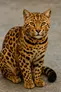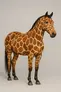

In [ ]:
# Encode the two images
test_image_features = []
model.eval()
with torch.no_grad():
    for image_path in image_paths_to_test:
        try:
            image = Image.open(image_path).convert("RGB")
            image_input = preprocess(image).unsqueeze(0).to(device)
            image_embedding = model.encode_image(image_input)
            image_embedding = F.normalize(image_embedding, dim=-1)
            test_image_features.append(image_embedding.cpu())
        except Exception as e:
            print(f"Error processing image {image_path}: {e}")

if test_image_features:
    test_image_features = torch.cat(test_image_features, dim=0)
    print(f"Shape of test image features: {test_image_features.shape}")
else:
    print("No test images successfully encoded.")

Shape of test image features: torch.Size([2, 512])


In [ ]:
# Use CLIP to predict labels
# using CIFAR-10 ensembled text features

# Ensure ensembled_text_features and test_image_features are on the same device
ensembled_text_features = ensembled_text_features.to(device)
test_image_features = test_image_features.to(device)


# Calculate similarity scores
similarity_scores = (100.0 * test_image_features @ ensembled_text_features.T).softmax(dim=-1)

# Get the top prediction for each image
values, indices = similarity_scores.topk(1, dim=1)

# Get the predicted labels
predicted_labels = [cifar_classes[index.item()] for index in indices]

print(f"Predicted labels for the images: {predicted_labels}")

Predicted labels for the images: ['horse', 'cat']


In [ ]:
# Compare true labels and predicted labels
print("\nComparison of True vs. Predicted Labels:")
for i, image_path in enumerate(image_paths_to_test):
    print(f"Image: {os.path.basename(image_path)}")
    print(f"  True Label: {true_labels[i]}")
    print(f"  Predicted Label (from CIFAR-10 classes): {predicted_labels[i]}")
    print("-" * 20)


Comparison of True vs. Predicted Labels:
Image: horse-as-giraffe.webp
  True Label: horse
  Predicted Label (from CIFAR-10 classes): horse
--------------------
Image: cat-as-leopard.webp
  True Label: cat
  Predicted Label (from CIFAR-10 classes): cat
--------------------
